<a href="https://colab.research.google.com/github/Davidlm613/cgm-remote-monitor/blob/master/Project2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Predicting House Sale Price

#Purpose

Use data defining features of homes sold to predict the sale price of a home.  Minimize residuals for a more accurate model.

#Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import itertools
from itertools import combinations
from sklearn import datasets
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from IPython.display import Image
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from google.colab import drive
drive.mount('/drive')

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Mounted at /drive


#Import Data

In [ ]:
housing_data = pd.read_csv("/drive/My Drive/Cohort_5/Projects/Project 2/Data/Housing Data.csv")
housing_combined = pd.read_csv("/drive/My Drive/project2/housing_combined.csv")
predict_var = pd.read_csv("/drive/My Drive/project2/predicted_var.csv")
pairplot_image = Image("/drive/MyDrive/Housing Data Pairplot.png")
heatmap_1 = Image("/drive/My Drive/heatmap_1.png")
heatmap_2 = Image("/drive/My Drive/heatmap_2.png")
heatmap_3 = Image("/drive/My Drive/heatmap_3.png")
heatmap_4 = Image("/drive/My Drive/heatmap_4.png")
r2_heatmap_1 = Image("/drive/My Drive/r^2 heatmap_1.png")
r2_heatmap_2 = Image("/drive/My Drive/r^2 heatmap_2.png")
r2_heatmap_3 = Image("/drive/My Drive/r^2 heatmap_3.png")
r2_heatmap_4 = Image("/drive/My Drive/r^2 heatmap_4.png")

#Find basic format of data.  Reshape data format if needed.

In [ ]:
print('Column Names:  ',housing_data.columns)
print('Info:  ',housing_data.info)
print('Describe:  ',housing_data.describe)
print('Data Types:  ',housing_data.dtypes)

NameError: ignored

In [ ]:
###Output of this is presented below, there maynot be any need to run this block!
for index in housing_data.columns:
  print(index,'   ',housing_data[index].dtype)

PID     int64
MS SubClass     int64
MS Zoning     object
Lot Frontage     float64
Lot Area     int64
Street     object
Alley     object
Lot Shape     object
Land Contour     object
Utilities     object
Lot Config     object
Land Slope     object
Neighborhood     object
Condition 1     object
Condition 2     object
Bldg Type     object
House Style     object
Overall Qual     int64
Overall Cond     int64
Year Built     int64
Year Remod/Add     int64
Roof Style     object
Roof Matl     object
Exterior 1st     object
Exterior 2nd     object
Mas Vnr Type     object
Mas Vnr Area     float64
Exter Qual     object
Exter Cond     object
Foundation     object
Bsmt Qual     object
Bsmt Cond     object
Bsmt Exposure     object
BsmtFin Type 1     object
BsmtFin SF 1     float64
BsmtFin Type 2     object
BsmtFin SF 2     float64
Bsmt Unf SF     float64
Total Bsmt SF     float64
Heating     object
Heating QC     object
Central Air     object
Electrical     object
1st Flr SF     int64
2nd Flr SF     i

####Create seperate dataframes with variables seperated based on descreet/continuious.

In [ ]:
##Create lists with the indexes for continuious and categorical data types.

housing_cat = pd.DataFrame()
housing_cont = pd.DataFrame()
for index in housing_combined.columns:
 if housing_combined[index].dtype == object:
   housing_cat[index] = housing_combined[index]
 if housing_combined[index].dtype == 'int64' or housing_combined[index].dtype == 'float64':
   housing_cont[index] = housing_combined[index]

#exceptions_index = pd.Index(['MS SubClass','Overall Qual','Overall Cond'])
housing_cat['MS SubClass'] = housing_combined['MS SubClass']
housing_cont.pop('MS SubClass')
housing_cat['Overall Qual'] = housing_combined['Overall Qual']
housing_cont.pop('Overall Qual')
housing_cat['Overall Cond'] = housing_combined['Overall Cond']
housing_cont.pop('Overall Cond')
housing_cat['Bsmt Full Bath'] = housing_combined['Bsmt Full Bath']
housing_cont.pop('Bsmt Full Bath')
housing_cat['Bsmt Half Bath'] = housing_combined['Bsmt Half Bath']
housing_cont.pop('Bsmt Half Bath')

housing_cat['Full Bath'] = housing_combined['Full Bath']
housing_cont.pop('Full Bath')
housing_cat['Half Bath'] = housing_combined['Half Bath']
housing_cont.pop('Half Bath')

print(housing_cat.columns)   
print(housing_cont.columns)

###Attempted to automate correct assignment of three variables with descreet data that contain integer values.
###It has not worked.  Manually made the alterations above.

#exceptions_index = pd.Index(['MS SubClass','Overall Qual','Overall Cond'])
#for name in enumerate(exceptions_index):
#  housing_cat[name] = housing_data[name]
#  housing_cont.pop(name)

#type(exceptions_index)
#for name in enumerate(exceptions_index):
#  try:
#     housing_cat[name] = housing_data[name]
#  try: 
#     housing_cont.pop(name)


Index(['MS Zoning', 'Street', 'Alley', 'Lot Shape', 'Land Contour',
       'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
       'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl',
       'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Exter Qual',
       'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure',
       'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating', 'Heating QC',
       'Central Air', 'Electrical', 'Kitchen Qual', 'Functional',
       'Fireplace Qu', 'Garage Type', 'Garage Finish', 'Garage Qual',
       'Garage Cond', 'Paved Drive', 'Pool QC', 'Fence', 'Misc Feature',
       'Sale Type', 'Sale Condition', 'MS SubClass', 'Overall Qual',
       'Overall Cond', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath',
       'Half Bath'],
      dtype='object')
Index(['Unnamed: 0', 'Unnamed: 0.1', 'PID', 'Lot Frontage', 'Lot Area',
       'Year Built', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1',
       'BsmtFin SF 2', 'B

In [ ]:
len(housing_cont.columns)

32

##Explore the NaN, blank, NA values in the data.

###Na's for continuious data.

In [ ]:
housing_combined.columns
#var_pred

Index(['Unnamed: 0', 'MS Zoning', 'Street', 'Alley', 'Lot Shape',
       'Land Contour', 'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood',
       'Condition 1', 'Condition 2', 'Bldg Type', 'House Style', 'Roof Style',
       'Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type',
       'Exter Qual', 'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond',
       'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating',
       'Heating QC', 'Central Air', 'Electrical', 'Kitchen Qual', 'Functional',
       'Fireplace Qu', 'Garage Type', 'Garage Finish', 'Garage Qual',
       'Garage Cond', 'Paved Drive', 'Pool QC', 'Fence', 'Misc Feature',
       'Sale Type', 'Sale Condition', 'MS SubClass', 'Overall Qual',
       'Overall Cond', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath',
       'Half Bath', 'Unnamed: 0.1', 'PID', 'Lot Frontage', 'Lot Area',
       'Year Built', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1',
       'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', 

####Columns in housing_data with Na / NaN in continuious data.  With method to fill using .fillna

* Lot Frontage   .median()
* Mas Vnr Area    .median()
* BsmtFin SF 1    .mean()
* BsmtFin SF 2    .mean()
* Bsmt Unf SF    .median()
* Total Bsmt SF    .median()
* Garage Yr Blt    .median()
* Garage Cars    .median()

In [ ]:
cont_col = housing_cont.columns

In [ ]:
### Identify continuious data columns with Na's.

names_cont =[]
for spot in cont_col:
  if housing_cont[spot].isna().sum().sum() != 0:
    names_cat.append(spot)
print(names_cont)

[]


In [ ]:
print(housing_cont)
#housing_saleprice

      Unnamed: 0  Unnamed: 0.1        PID  ...  Misc Val  Mo Sold  Yr Sold
0              0             0  905101070  ...         0        7     2007
1              1             1  905101330  ...       500       10     2006
2              2             2  903454090  ...         0       12     2007
3              3             3  533244030  ...         0        4     2010
4              4             4  909252020  ...         0        4     2009
...          ...           ...        ...  ...       ...      ...      ...
2632        2632          2632  903231070  ...       400        9     2006
2633        2633          2633  906201021  ...         0        7     2009
2634        2634          2634  533253070  ...         0        9     2009
2635        2635          2635  527376100  ...         0        8     2009
2636        2636          2636  528292060  ...         0        5     2008

[2637 rows x 32 columns]


#####Na's for descreet data.

In [ ]:
cat_col = housing_cat.columns
cat_col

Index(['MS Zoning', 'Street', 'Alley', 'Lot Shape', 'Land Contour',
       'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
       'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl',
       'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Exter Qual',
       'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure',
       'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating', 'Heating QC',
       'Central Air', 'Electrical', 'Kitchen Qual', 'Functional',
       'Fireplace Qu', 'Garage Type', 'Garage Finish', 'Garage Qual',
       'Garage Cond', 'Paved Drive', 'Pool QC', 'Fence', 'Misc Feature',
       'Sale Type', 'Sale Condition', 'MS SubClass', 'Overall Qual',
       'Overall Cond', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath',
       'Half Bath'],
      dtype='object')

In [ ]:
### Identify descreet data columns with Na's.

names_cat =[]
for spot in cat_col:
  if housing_data[spot].isna().sum().sum() != 0:
    names_cat.append(spot)
print(names_cat)

['Alley', 'Mas Vnr Type', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin Type 2', 'Fireplace Qu', 'Garage Type', 'Garage Finish', 'Garage Qual', 'Garage Cond', 'Pool QC', 'Fence', 'Misc Feature', 'Bsmt Full Bath', 'Bsmt Half Bath']


In [ ]:
names_cat

['Alley',
 'Mas Vnr Type',
 'Bsmt Qual',
 'Bsmt Cond',
 'Bsmt Exposure',
 'BsmtFin Type 1',
 'BsmtFin Type 2',
 'Fireplace Qu',
 'Garage Type',
 'Garage Finish',
 'Garage Qual',
 'Garage Cond',
 'Pool QC',
 'Fence',
 'Misc Feature',
 'Bsmt Full Bath',
 'Bsmt Half Bath']

In [ ]:
###### To replace Na values with 'NA'.
na_rep = ['Alley','Bsmt Qual','Bsmt Cond','Bsmt Exposure','BsmtFin Type 1','BsmtFin Type 2','Fireplace Qu','Garage Finish','Garage Qual','Garage Type','Garage Cond','Pool QC','Fence','Misc Feature']
for this_one in na_rep:
  print(this_one)
  housing_cat[this_one].fillna("none",inplace=True)


Alley
Bsmt Qual
Bsmt Cond
Bsmt Exposure
BsmtFin Type 1
BsmtFin Type 2
Fireplace Qu
Garage Finish
Garage Qual
Garage Type
Garage Cond
Pool QC
Fence
Misc Feature


In [ ]:
###### To replace Na values with 'None' and 0.0.  Determined from variable description.
housing_data['Mas Vnr Type'].fillna('None',inplace=True)
      
housing_data['Bsmt Full Bath'].fillna(0.0,inplace=True)
housing_data['Bsmt Half Bath'].fillna(0.0,inplace=True)

In [ ]:
for nam in names_cat:
  print(pd.unique(housing_data[nam]))
  print(f"Sum of Na's: {housing_data[nam].isna().sum().sum()}")
  print(housing_data[nam].value_counts())
  print(len(housing_data[nam]))
#housing_data[nam][40:100]

[nan 'Pave' 'Grvl']
Sum of Na's: 2457
Grvl    111
Pave     69
Name: Alley, dtype: int64
2637
['None' 'Stone' 'BrkFace' 'BrkCmn' 'CBlock']
Sum of Na's: 0
None       1607
BrkFace     782
Stone       224
BrkCmn       23
CBlock        1
Name: Mas Vnr Type, dtype: int64
2637
['TA' nan 'Gd' 'Ex' 'Fa' 'Po']
Sum of Na's: 73
TA    1161
Gd    1093
Ex     229
Fa      79
Po       2
Name: Bsmt Qual, dtype: int64
2637
['TA' nan 'Gd' 'Fa' 'Po' 'Ex']
Sum of Na's: 73
TA    2358
Gd     107
Fa      92
Po       5
Ex       2
Name: Bsmt Cond, dtype: int64
2637
['No' nan 'Av' 'Mn' 'Gd']
Sum of Na's: 76
No    1722
Av     375
Gd     248
Mn     216
Name: Bsmt Exposure, dtype: int64
2637
['Rec' nan 'Unf' 'GLQ' 'ALQ' 'LwQ' 'BLQ']
Sum of Na's: 73
Unf    768
GLQ    758
ALQ    397
Rec    262
BLQ    237
LwQ    142
Name: BsmtFin Type 1, dtype: int64
2637
['LwQ' nan 'Unf' 'BLQ' 'Rec' 'GLQ' 'ALQ']
Sum of Na's: 74
Unf    2245
Rec     100
LwQ      76
BLQ      60
ALQ      50
GLQ      32
Name: BsmtFin Type 2, dtype: int64
2

#Correlations.

In [ ]:
cor_matrix = housing_cont.corr().round(2)

In [ ]:
#del r_square
r_square = np.square(cor_matrix)
r_square

,Unnamed: 0,Unnamed: 0.1,PID,Lot Frontage,Lot Area,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold
Unnamed: 0,1.0000,1.0000,0.0001,0.0001,0.0001,0.0025,0.0004,0.0001,0.0016,0.0004,0.0004,0.0001,0.0001,0.0004,0.0001,0.0001,0.0004,0.0004,0.0001,0.0001,0.0025,0.0004,0.0001,0.0000,0.0009,0.0001,0.0004,0.0009,0.0016,0.0001,0.0000,0.0004
Unnamed: 0.1,1.0000,1.0000,0.0001,0.0001,0.0001,0.0025,0.0004,0.0001,0.0016,0.0004,0.0004,0.0001,0.0001,0.0004,0.0001,0.0001,0.0004,0.0004,0.0001,0.0001,0.0025,0.0004,0.0001,0.0000,0.0009,0.0001,0.0004,0.0009,0.0016,0.0001,0.0000,0.0004
PID,0.0001,0.0001,1.0000,0.0100,0.0004,0.1225,0.0256,0.0576,0.0121,0.0000,0.0064,0.0400,0.0225,0.0000,0.0036,0.0121,0.0001,0.0081,0.0049,0.0121,0.0625,0.0625,0.0484,0.0025,0.0064,0.0289,0.0004,0.0009,0.0000,0.0004,0.0025,0.0004
Lot Frontage,0.0001,0.0001,0.0100,1.0000,0.1444,0.0144,0.0100,0.0400,0.0361,0.0009,0.0121,0.1089,0.1849,0.0004,0.0000,0.1156,0.0441,0.0000,0.1024,0.0441,0.0064,0.0784,0.1089,0.0100,0.0225,0.0001,0.0004,0.0036,0.0225,0.0001,0.0004,0.0001
Lot Area,0.0001,0.0001,0.0004,0.1444,1.0000,0.0009,0.0009,0.0196,0.0361,0.0036,0.0009,0.0625,0.1225,0.0025,0.0000,0.0961,0.0256,0.0004,0.0576,0.0676,0.0001,0.0400,0.0529,0.0324,0.0144,0.0004,0.0004,0.0025,0.0100,0.0025,0.0004,0.0009
Year Built,0.0025,0.0025,0.1225,0.0144,0.0009,1.0000,0.3721,0.0900,0.0729,0.0009,0.0169,0.1681,0.0900,0.0004,0.0196,0.0576,0.0036,0.0196,0.0100,0.0256,0.6084,0.2809,0.2304,0.0484,0.0361,0.1521,0.0001,0.0036,0.0001,0.0009,0.0001,0.0001
Year Remod/Add,0.0004,0.0004,0.0256,0.0100,0.0009,0.3721,1.0000,0.0361,0.0196,0.0036,0.0289,0.0900,0.0576,0.0256,0.0036,0.0961,0.0009,0.0196,0.0400,0.0169,0.3844,0.1849,0.1444,0.0441,0.0529,0.0529,0.0009,0.0025,0.0001,0.0009,0.0004,0.0016
Mas Vnr Area,0.0001,0.0001,0.0576,0.0400,0.0196,0.0900,0.0361,1.0000,0.0784,0.0001,0.0081,0.1444,0.1369,0.0144,0.0036,0.1521,0.0064,0.0025,0.0729,0.0729,0.0529,0.1225,0.1296,0.0225,0.0169,0.0121,0.0009,0.0036,0.0001,0.0009,0.0000,0.0004
BsmtFin SF 1,0.0016,0.0016,0.0121,0.0361,0.0361,0.0729,0.0196,0.0784,1.0000,0.0036,0.2401,0.2704,0.1936,0.0256,0.0049,0.0361,0.0144,0.0064,0.0009,0.0841,0.0324,0.0576,0.0841,0.0484,0.0100,0.0100,0.0049,0.0064,0.0081,0.0004,0.0000,0.0009
BsmtFin SF 2,0.0004,0.0004,0.0000,0.0009,0.0036,0.0009,0.0036,0.0001,0.0036,1.0000,0.0576,0.0100,0.0081,0.0100,0.0001,0.0004,0.0016,0.0016,0.0025,0.0049,0.0049,0.0001,0.0001,0.0100,0.0000,0.0016,0.0004,0.0064,0.0025,0.0000,0.0001,0.0001


###Pair plot. Import image.  Much faster then generating the image. MUCH faster....

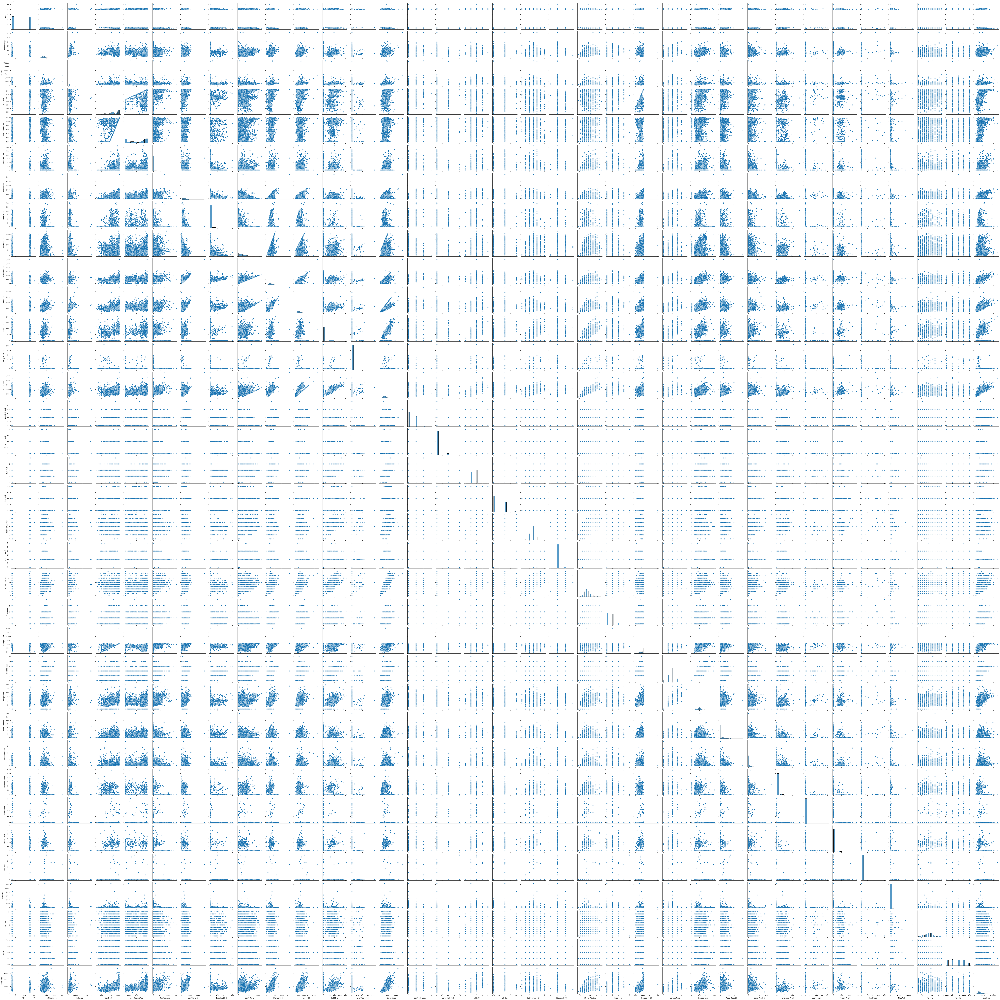

In [ ]:
pairplot_image

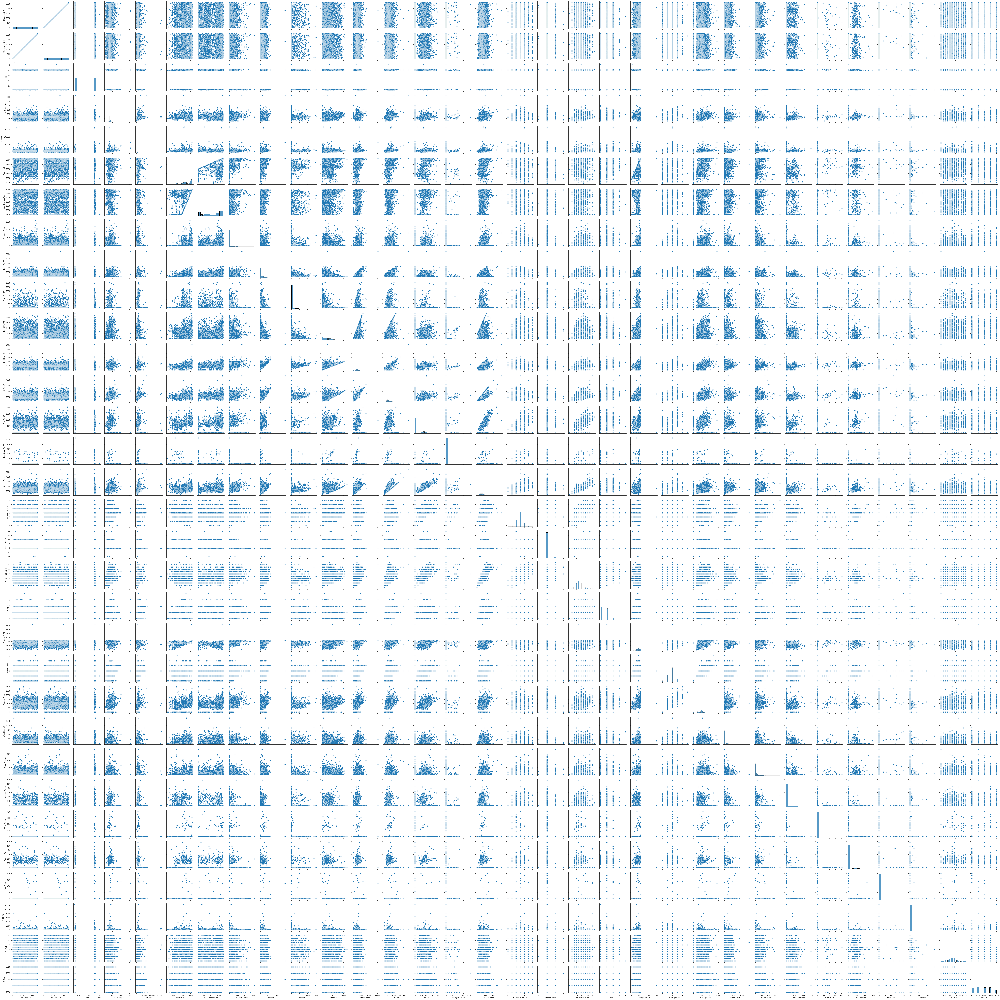

In [ ]:
### No need to run.  Output saved and loaded in last cell.  Plus it takes forever to run.
### Just run next cell.

housing_cont_pp = sns.pairplot(housing_cont)
housing_cont_pp.savefig("/drive/My Drive/Housing Data Pairplot2.png")

###Heatmaps.

In [ ]:
heatmap_1

In [ ]:
heatmap_2

In [ ]:
heatmap_3

In [ ]:
heatmap_4

#####No need to run.  Images saved and can be imported above.

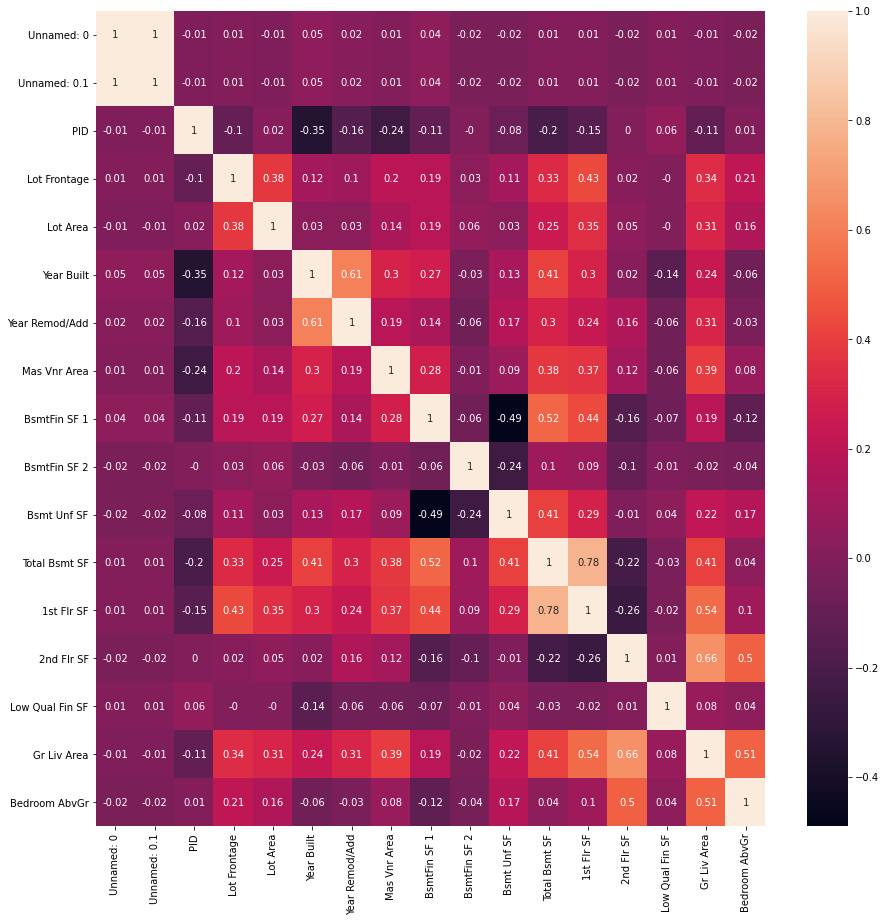

In [ ]:
plt.figure(figsize=(15,15))
heatmap_1 = sns.heatmap(data=cor_matrix.iloc[:17,:17], annot = True)
fig = heatmap_1.get_figure()
fig.savefig("/drive/My Drive/heatmap_1.png")

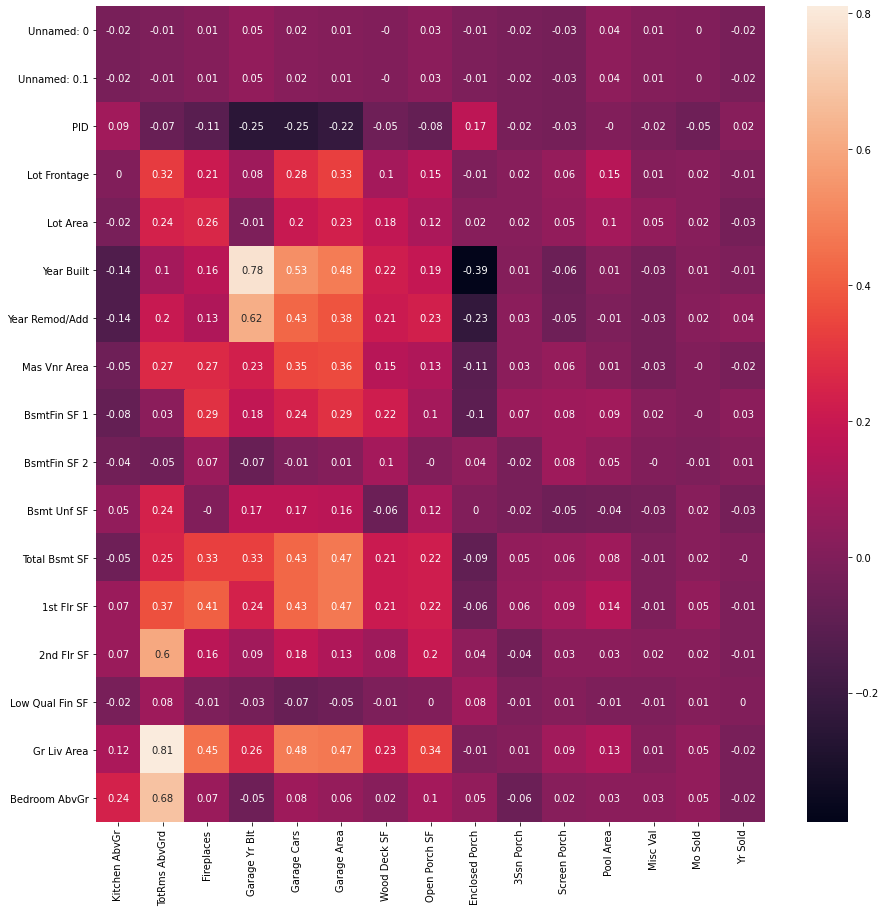

In [ ]:
plt.figure(figsize=(15,15))
heatmap_2 = sns.heatmap(data=cor_matrix.iloc[:17,17:], annot = True)
fig = heatmap_2.get_figure()
fig.savefig("/drive/My Drive/heatmap_2.png")

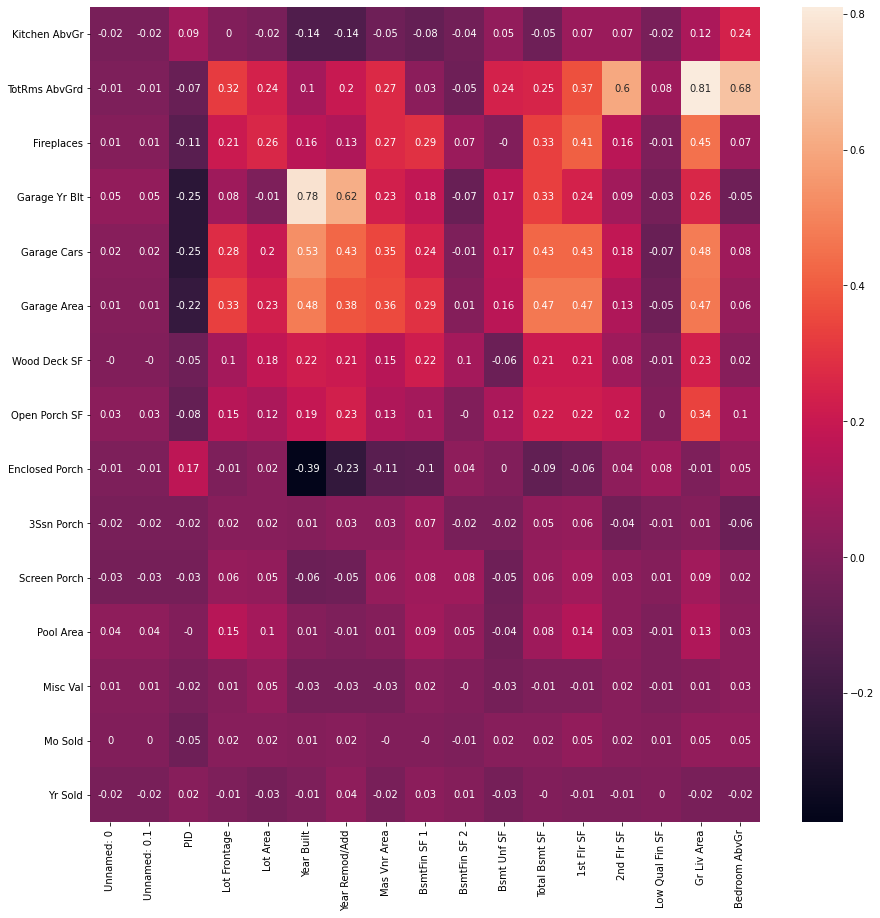

In [ ]:
plt.figure(figsize=(15,15))
heatmap_3 = sns.heatmap(data=cor_matrix.iloc[17:,:17], annot = True)
fig = heatmap_3.get_figure()
fig.savefig("/drive/My Drive/heatmap_3.png")

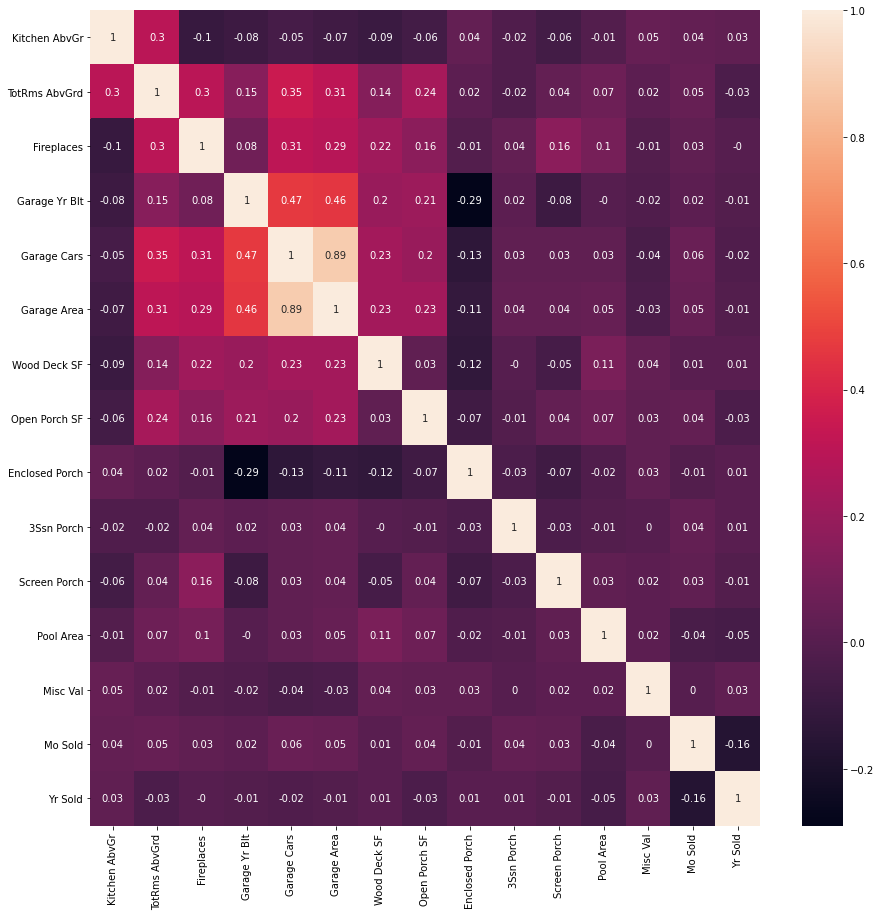

In [ ]:
plt.figure(figsize=(15,15))
heatmap_4 = sns.heatmap(data=cor_matrix.iloc[17:,17:], annot = True)
fig = heatmap_4.get_figure()
fig.savefig("/drive/My Drive/heatmap_4.png")

####r^2 heatmaps

In [ ]:
r2_heatmap_1

In [ ]:
r2_heatmap_2

In [ ]:
r2_heatmap_3

In [ ]:
r2_heatmap_4

######No need to run.  Import images above.

In [ ]:
plt.figure(figsize=(15,15))
rsq_1 = sns.heatmap(data=r_square.iloc[:17,:17], annot = True)
fig = rsq_1.get_figure()
fig.savefig("/drive/My Drive/r^2 heatmap_1.png")

In [ ]:
plt.figure(figsize=(15,15))
rsq_2 = sns.heatmap(data=r_square.iloc[:17,17:], annot = True)
fig = rsq_2.get_figure()
fig.savefig("/drive/My Drive/r^2 heatmap_2.png")

In [ ]:
plt.figure(figsize=(15,15))
rsq_3 = sns.heatmap(data=r_square.iloc[17:,:17], annot = True)
fig = rsq_3.get_figure()
fig.savefig("/drive/My Drive/r^2 heatmap_3.png")

In [ ]:
plt.figure(figsize=(15,15))
rsq_4 = sns.heatmap(data=r_square.iloc[17:,17:], annot = True)
fig = rsq_4.get_figure()
fig.savefig("/drive/My Drive/r^2 heatmap_4.png")

#Processing.  Fit linear models and test them.

In [ ]:
housing_cont.iloc[:,1:32]

In [ ]:
predictors2 = housing_cont.copy()
predictors = sm.add_constant(predictors2) 

In [ ]:
housing_combined.iloc[:,33]
housing_combined.columns[51:101]

In [ ]:
predictors

##Format continuious data for LM.  'predictors' includes all continuious variables.

In [ ]:
housing_saleprice = housing_data['SalePrice']

In [ ]:
predictors.columns

##Format descreet data for LM. 'predictors' includes all descreet data.
`Next time try pd.get_dummies(x,columns=[],prefix=[])`

In [ ]:
cat_col_use = housing_cat.columns
cat_col_use

Index(['MS Zoning', 'Street', 'Alley', 'Lot Shape', 'Land Contour',
       'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
       'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl',
       'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Exter Qual',
       'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure',
       'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating', 'Heating QC',
       'Central Air', 'Electrical', 'Kitchen Qual', 'Functional',
       'Fireplace Qu', 'Garage Type', 'Garage Finish', 'Garage Qual',
       'Garage Cond', 'Paved Drive', 'Pool QC', 'Fence', 'Misc Feature',
       'Sale Type', 'Sale Condition', 'MS SubClass', 'Overall Qual',
       'Overall Cond', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath',
       'Half Bath'],
      dtype='object')

In [ ]:
cat_col = housing_cat.columns

In [ ]:
housing_cat_dm = pd.get_dummies(housing_cat, prefix="dm")

In [ ]:
print(housing_cat_dm.columns[60:120])
print(cat_col)

Index(['dm_SawyerW', 'dm_Somerst', 'dm_StoneBr', 'dm_Timber', 'dm_Veenker',
       'dm_Artery', 'dm_Feedr', 'dm_Norm', 'dm_PosA', 'dm_PosN', 'dm_RRAe',
       'dm_RRAn', 'dm_RRNe', 'dm_RRNn', 'dm_Artery', 'dm_Feedr', 'dm_Norm',
       'dm_PosA', 'dm_PosN', 'dm_RRAe', 'dm_RRAn', 'dm_RRNn', 'dm_1Fam',
       'dm_2fmCon', 'dm_Duplex', 'dm_Twnhs', 'dm_TwnhsE', 'dm_1.5Fin',
       'dm_1.5Unf', 'dm_1Story', 'dm_2.5Fin', 'dm_2.5Unf', 'dm_2Story',
       'dm_SFoyer', 'dm_SLvl', 'dm_Flat', 'dm_Gable', 'dm_Gambrel', 'dm_Hip',
       'dm_Mansard', 'dm_Shed', 'dm_ClyTile', 'dm_CompShg', 'dm_Membran',
       'dm_Metal', 'dm_Roll', 'dm_Tar&Grv', 'dm_WdShake', 'dm_WdShngl',
       'dm_AsbShng', 'dm_AsphShn', 'dm_BrkComm', 'dm_BrkFace', 'dm_CBlock',
       'dm_CemntBd', 'dm_HdBoard', 'dm_ImStucc', 'dm_MetalSd', 'dm_Plywood',
       'dm_PreCast'],
      dtype='object')


NameError: ignored

In [ ]:
housin_lm = 

In [ ]:
housing_cat_le = list()
housing_cat_leoh = housing_cat.copy()

In [ ]:
#####Finally! It works!!!!
### Don't do it again without trying pd.get_dummies(x,columns=[],prefix=[])!

dvar_lab = LabelEncoder()
dvar_ohe = OneHotEncoder(handle_unknown='ignore')
for k in range(50):
  print(housing_cat.columns[k])
  housing_cat_le[k] = dvar_lab.fit_transform([housing_cat.columns[k]])
  housing_cat_leoh[k] = dvar_ohe.fit_transform([housing_cat[housing_cat.columns[k]]])

MS Zoning


IndexError: ignored

##Combine the continuious and OneHotEncoder-ed descreet dataframes into one.

In [ ]:
housing_cat_dm

,MS SubClass,Overall Qual,Overall Cond,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,dm_A (agr),dm_C (all),dm_FV,dm_I (all),dm_RH,dm_RL,dm_RM,dm_Grvl,dm_Pave,dm_Grvl,dm_Pave,dm_IR1,dm_IR2,dm_IR3,dm_Reg,dm_Bnk,dm_HLS,dm_Low,dm_Lvl,dm_AllPub,dm_NoSeWa,dm_NoSewr,dm_Corner,dm_CulDSac,dm_FR2,dm_FR3,dm_Inside,dm_Gtl,dm_Mod,dm_Sev,dm_Blmngtn,dm_Blueste,dm_BrDale,...,dm_VWD,dm_WD,dm_Abnorml,dm_AdjLand,dm_Alloca,dm_Family,dm_Normal,dm_Partial,Unnamed: 0,Unnamed: 0.1,PID,Lot Frontage,Lot Area,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold
0,20,4,3,1.0,0.0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0,905101070,62.0,14299,1964,1964,0.0,513.0,144.0,348.0,1005.0,1005,0,0,1005,3,1,5,0,1964.0,2.0,440.0,0,0,0,0,0,0,0,7,2007
1,90,4,5,0.0,0.0,2,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,1,1,905101330,72.0,10791,1967,1967,0.0,0.0,0.0,0.0,0.0,1296,0,0,1296,2,2,6,0,1967.0,2.0,516.0,0,0,0,0,0,0,500,10,2006
2,50,6,6,0.0,0.0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2,2,903454090,50.0,9000,1937,1950,0.0,0.0,0.0,780.0,780.0,780,595,0,1375,3,1,6,1,1979.0,1.0,544.0,0,162,0,0,126,0,0,12,2007
3,60,8,5,1.0,0.0,2,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,3,3,533244030,68.0,7379,2000,2000,0.0,484.0,0.0,491.0,975.0,975,873,0,1848,3,1,7,1,2000.0,2.0,592.0,280,184,0,0,0,0,0,4,2010
4,70,7,9,1.0,0.0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,4,4,909252020,60.0,7200,1936,2007,0.0,350.0,210.0,0.0,560.0,575,560,0,1135,3,1,6,0,1971.0,2.0,576.0,256,0,0,0,0,0,0,4,2009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2632,50,6,6,0.0,0.0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2632,2632,903231070,52.0,6240,1934,1950,0.0,0.0,0.0,816.0,816.0,816,0,360,1176,3,1,6,1,1985.0,2.0,528.0,112,0,0,0,0,0,400,9,2006
2633,80,7,6,1.0,0.0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2633,2633,906201021,74.0,10778,1990,1991,0.0,460.0,286.0,308.0,1054.0,1061,0,0,1061,1,1,4,0,1990.0,2.0,462.0,114,36,0,0,0,0,0,7,2009
2634,120,8,5,1.0,0.0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2634,2634,533253070,61.0,3782,1981,1981,0.0,960.0,0.0,266.0,1226.0,1226,0,0,1226,1,1,4,2,1981.0,2.0,484.0,133,78,0,0,0,0,0,9,2009
2635,20,6,5,0.0,0.0,2,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2635,2635,527376100,78.0,10140,1974,1974,174.0,0.0,0.0,1064.0,1064.0,1350,0,0,1350,3,1,7,1,1974.0,2.0,478.0,0,0,0,0,0,0,0,8,2009


In [ ]:
#housing_cat = housing_cat.join(housing_cat_leoh)
housing_cat_dm = housing_cat_dm.join(housing_cont)



In [ ]:
housing_cat_dm 

,MS SubClass,Overall Qual,Overall Cond,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,dm_A (agr),dm_C (all),dm_FV,dm_I (all),dm_RH,dm_RL,dm_RM,dm_Grvl,dm_Pave,dm_Grvl,dm_Pave,dm_IR1,dm_IR2,dm_IR3,dm_Reg,dm_Bnk,dm_HLS,dm_Low,dm_Lvl,dm_AllPub,dm_NoSeWa,dm_NoSewr,dm_Corner,dm_CulDSac,dm_FR2,dm_FR3,dm_Inside,dm_Gtl,dm_Mod,dm_Sev,dm_Blmngtn,dm_Blueste,dm_BrDale,...,dm_VWD,dm_WD,dm_Abnorml,dm_AdjLand,dm_Alloca,dm_Family,dm_Normal,dm_Partial,Unnamed: 0,Unnamed: 0.1,PID,Lot Frontage,Lot Area,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold
0,20,4,3,1.0,0.0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0,905101070,62.0,14299,1964,1964,0.0,513.0,144.0,348.0,1005.0,1005,0,0,1005,3,1,5,0,1964.0,2.0,440.0,0,0,0,0,0,0,0,7,2007
1,90,4,5,0.0,0.0,2,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,1,1,905101330,72.0,10791,1967,1967,0.0,0.0,0.0,0.0,0.0,1296,0,0,1296,2,2,6,0,1967.0,2.0,516.0,0,0,0,0,0,0,500,10,2006
2,50,6,6,0.0,0.0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2,2,903454090,50.0,9000,1937,1950,0.0,0.0,0.0,780.0,780.0,780,595,0,1375,3,1,6,1,1979.0,1.0,544.0,0,162,0,0,126,0,0,12,2007
3,60,8,5,1.0,0.0,2,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,3,3,533244030,68.0,7379,2000,2000,0.0,484.0,0.0,491.0,975.0,975,873,0,1848,3,1,7,1,2000.0,2.0,592.0,280,184,0,0,0,0,0,4,2010
4,70,7,9,1.0,0.0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,4,4,909252020,60.0,7200,1936,2007,0.0,350.0,210.0,0.0,560.0,575,560,0,1135,3,1,6,0,1971.0,2.0,576.0,256,0,0,0,0,0,0,4,2009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2632,50,6,6,0.0,0.0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2632,2632,903231070,52.0,6240,1934,1950,0.0,0.0,0.0,816.0,816.0,816,0,360,1176,3,1,6,1,1985.0,2.0,528.0,112,0,0,0,0,0,400,9,2006
2633,80,7,6,1.0,0.0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2633,2633,906201021,74.0,10778,1990,1991,0.0,460.0,286.0,308.0,1054.0,1061,0,0,1061,1,1,4,0,1990.0,2.0,462.0,114,36,0,0,0,0,0,7,2009
2634,120,8,5,1.0,0.0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2634,2634,533253070,61.0,3782,1981,1981,0.0,960.0,0.0,266.0,1226.0,1226,0,0,1226,1,1,4,2,1981.0,2.0,484.0,133,78,0,0,0,0,0,9,2009
2635,20,6,5,0.0,0.0,2,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2635,2635,527376100,78.0,10140,1974,1974,174.0,0.0,0.0,1064.0,1064.0,1350,0,0,1350,3,1,7,1,1974.0,2.0,478.0,0,0,0,0,0,0,0,8,2009


#Horray!!! don't have to run any of that again!  Hopefully...... 
Finished data cleaning, saved to "/drive/My Drive/project2/housing_combined.csv"

In [ ]:
housing_combined.to_csv("/drive/My Drive/project2/housing_combined.csv")

#Linear regression.

In [ ]:
housing_cat_dm

NameError: ignored

In [ ]:
pr_train, pr_test, re_train, re_test = train_test_split(housing_cat_dm,housing_saleprice,test_size=0.25,random_state=0)

In [ ]:
model_home = sm.OLS(re_train,pr_train).fit()
model_home.summary()

In [ ]:
model_home.pvalues[60:120]

dm_SawyerW    3.756022e-02
dm_Somerst    2.078647e-02
dm_StoneBr    1.426305e-11
dm_Timber     2.590315e-01
dm_Veenker    4.302642e-01
dm_Artery     7.204118e-01
dm_Feedr      6.857545e-01
dm_Norm       2.883535e-01
dm_PosA       3.355438e-01
dm_PosN       1.611651e-01
dm_RRAe       5.849900e-01
dm_RRAn       7.226708e-01
dm_RRNe       2.779311e-01
dm_RRNn       8.452155e-01
dm_Artery     2.038064e-01
dm_Feedr      2.316995e-01
dm_Norm       1.848662e-01
dm_PosA       1.047484e-06
dm_PosN       4.108459e-05
dm_RRAe       1.603098e-01
dm_RRAn       2.295859e-01
dm_RRNn       2.451707e-01
dm_1Fam       3.481720e-01
dm_2fmCon     2.274846e-01
dm_Duplex     5.382244e-01
dm_Twnhs      7.137990e-01
dm_TwnhsE     6.298143e-01
dm_1.5Fin     4.696437e-01
dm_1.5Unf     2.598948e-01
dm_1Story     3.984841e-01
dm_2.5Fin     9.411657e-01
dm_2.5Unf     6.178760e-01
dm_2Story     5.178293e-01
dm_SFoyer     3.360233e-01
dm_SLvl       3.386858e-01
dm_Flat       6.968179e-01
dm_Gable      6.218518e-01
d

In [ ]:
housing_cat_dm.drop(['Lot Area', 'dm_ClyTile', 'Overall Qual', 'Overall Cond', 'dm_StoneBr', 'dm_Membran', 'dm_CompShg', 'dm_Metal', 'dm_Tar&Grv', 'dm_WdShngl', 'Year Built', 'dm_Ex'],axis=1,inplace=True)

NameError: ignored

In [ ]:
col_nam = housing_cat_dm.columns

In [ ]:
housing_saleprice.shape

(2637,)

In [ ]:
housing_cat_dm['Yr Sold'] = housing_combined['Yr Sold']

In [ ]:
housing_cat_dm.drop("Yr Sold", axis=1, inplace=True)
col_nam = housing_cat_dm.columns

In [ ]:
housing_saleprice = housing_data["SalePrice"]

In [ ]:
housing_cat_dm

,MS SubClass,Overall Qual,Overall Cond,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,dm_A (agr),dm_C (all),dm_FV,dm_I (all),dm_RH,dm_RL,dm_RM,dm_Grvl,dm_Pave,dm_Grvl,dm_Pave,dm_IR1,dm_IR2,dm_IR3,dm_Reg,dm_Bnk,dm_HLS,dm_Low,dm_Lvl,dm_AllPub,dm_NoSeWa,dm_NoSewr,dm_Corner,dm_CulDSac,dm_FR2,dm_FR3,dm_Inside,dm_Gtl,dm_Mod,dm_Sev,dm_Blmngtn,dm_Blueste,dm_BrDale,...,dm_VWD,dm_WD,dm_Abnorml,dm_AdjLand,dm_Alloca,dm_Family,dm_Normal,dm_Partial,Unnamed: 0,Unnamed: 0.1,PID,Lot Frontage,Lot Area,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold
0,20,4,3,1.0,0.0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0,905101070,62.0,14299,1964,1964,0.0,513.0,144.0,348.0,1005.0,1005,0,0,1005,3,1,5,0,1964.0,2.0,440.0,0,0,0,0,0,0,0,7,2007
1,90,4,5,0.0,0.0,2,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,1,1,905101330,72.0,10791,1967,1967,0.0,0.0,0.0,0.0,0.0,1296,0,0,1296,2,2,6,0,1967.0,2.0,516.0,0,0,0,0,0,0,500,10,2006
2,50,6,6,0.0,0.0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2,2,903454090,50.0,9000,1937,1950,0.0,0.0,0.0,780.0,780.0,780,595,0,1375,3,1,6,1,1979.0,1.0,544.0,0,162,0,0,126,0,0,12,2007
3,60,8,5,1.0,0.0,2,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,3,3,533244030,68.0,7379,2000,2000,0.0,484.0,0.0,491.0,975.0,975,873,0,1848,3,1,7,1,2000.0,2.0,592.0,280,184,0,0,0,0,0,4,2010
4,70,7,9,1.0,0.0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,4,4,909252020,60.0,7200,1936,2007,0.0,350.0,210.0,0.0,560.0,575,560,0,1135,3,1,6,0,1971.0,2.0,576.0,256,0,0,0,0,0,0,4,2009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2632,50,6,6,0.0,0.0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2632,2632,903231070,52.0,6240,1934,1950,0.0,0.0,0.0,816.0,816.0,816,0,360,1176,3,1,6,1,1985.0,2.0,528.0,112,0,0,0,0,0,400,9,2006
2633,80,7,6,1.0,0.0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2633,2633,906201021,74.0,10778,1990,1991,0.0,460.0,286.0,308.0,1054.0,1061,0,0,1061,1,1,4,0,1990.0,2.0,462.0,114,36,0,0,0,0,0,7,2009
2634,120,8,5,1.0,0.0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2634,2634,533253070,61.0,3782,1981,1981,0.0,960.0,0.0,266.0,1226.0,1226,0,0,1226,1,1,4,2,1981.0,2.0,484.0,133,78,0,0,0,0,0,9,2009
2635,20,6,5,0.0,0.0,2,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2635,2635,527376100,78.0,10140,1974,1974,174.0,0.0,0.0,1064.0,1064.0,1350,0,0,1350,3,1,7,1,1974.0,2.0,478.0,0,0,0,0,0,0,0,8,2009


In [ ]:
housing_cat_dm.pop("dm_Y")

,dm_Y,dm_Y
0,1,0
1,1,1
2,1,0
3,1,1
4,1,1
...,...,...
2632,1,1
2633,1,1
2634,1,1
2635,1,1


In [ ]:
housing_saleprice = housing_data["SalePrice"]
col_nam = housing_cat_dm.columns
pre_corr = pd.Series()
for i in list(col_nam):
  print(i)
  print(np.corrcoef(housing_cat_dm.loc[:,f"{i}"], housing_saleprice)[1,0])
  pre_corr[i] = np.corrcoef(housing_cat_dm.loc[:,f"{i}"], housing_saleprice)[1,0]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  This is separate from the ipykernel package so we can avoid doing imports until


MS SubClass
-0.07885724213380178
Overall Qual
0.8050159495026092
Overall Cond
-0.09520463404184396
Bsmt Full Bath
0.27706027401415706
Bsmt Half Bath
-0.04245756310608772
Full Bath
0.5423858186608831
Half Bath
0.2870630337924922
dm_A (agr)
-0.04668956549457621
dm_C (all)
-0.12519363306220596
dm_FV
0.11267299219051576
dm_I (all)
-0.0350731432122401
dm_RH
-0.05117036523051741
dm_RL
0.2438088871204945
dm_RM
-0.2912404028842514
dm_IR1
0.2747900248374774
dm_IR2
0.10043532229151975
dm_IR3
0.030654081506185753
dm_Reg
-0.3065726028281419
dm_Bnk
-0.0928665216236501
dm_HLS
0.19176961776581444
dm_Low
0.01087820244809532
dm_Lvl
-0.07174486124064419
dm_AllPub
0.03302284355302316
dm_NoSeWa
-0.010569264920370667
dm_NoSewr
-0.03296186615978982
dm_Corner
-0.004777639083427221
dm_CulDSac
0.1388787533407488
dm_FR2
-0.009735849138843764
dm_FR3
0.00809659001701044
dm_Inside
-0.06806285951169297
dm_Gtl
-0.06622110622999526
dm_Blmngtn
0.015680729439245058
dm_Blueste
-0.028681090216109845
dm_BrDale
-0.09667854

In [ ]:
sor_pre_corr = pd.Series(sorted(pre_corr, reverse=True,),index=pre_corr.index)

In [ ]:
sor_pre_corr[45]**2

IndexError: ignored

In [ ]:
print(sor_pre_corr[1]**2)
len(sor_pre_corr)
for i in range(169):
  print(i, sor_pre_corr[i]**2)

0.41880415589371667
0 0.4977048430916375
1 0.41880415589371667
2 0.40180020968472907
3 0.39505416142638594
4 0.38222959028220116
5 0.29418237628443633
6 0.2915262592736681
7 0.27101938800417863
8 0.2606475101881092
9 0.2493990959870379
10 0.24389088592226166
11 0.21985403621171531
12 0.19204141974777486
13 0.18987501562765438
14 0.1829689930101095
15 0.12806556790303503
16 0.12595800699136417
17 0.12481825603488164
18 0.11539063288958208
19 0.10372234001418872
20 0.09632366793870627
21 0.08504217485496177
22 0.08240518537014953
23 0.07702839730124263
24 0.07676239543679979
25 0.07550955775018144
26 0.07185577210287987
27 0.05944277343893403
28 0.05819340454899085
29 0.04898672312406291
30 0.04630785110040569
31 0.03677558629804657
32 0.030510975474283313
33 0.027209900035594262
34 0.0268001972042748
35 0.01928730812948055
36 0.019195029149951796
37 0.018976691524167807
38 0.018285496477566564
39 0.017368263409023366
40 0.015273329941990764
41 0.013637070369253494
42 0.01269520316916402

In [ ]:
sel_sor_pre_corr[:60]

MS SubClass        0.705482
Bsmt Full Bath     0.647151
Bsmt Half Bath     0.633877
Full Bath          0.628533
Half Bath          0.618247
dm_A (agr)         0.542386
dm_C (all)         0.539932
dm_FV              0.520595
dm_I (all)         0.510536
dm_RH              0.499399
dm_RL              0.493853
dm_RM              0.468886
dm_IR1             0.438225
dm_IR2             0.435747
dm_IR3             0.427749
dm_Reg             0.357862
dm_Bnk             0.354906
dm_HLS             0.353296
dm_Low             0.339692
dm_Lvl             0.322060
dm_AllPub          0.310361
dm_NoSeWa          0.291620
dm_NoSewr          0.287063
dm_Corner          0.277540
dm_CulDSac         0.277060
dm_FR2             0.274790
dm_FR3             0.268059
dm_Inside          0.243809
dm_Gtl             0.241233
dm_Blmngtn         0.221329
dm_Blueste         0.215193
dm_BrDale          0.191770
dm_BrkSide         0.174674
dm_ClearCr         0.164954
dm_CollgCr         0.163708
dm_Crawfor         0

In [ ]:
sel_sor_pre_corr =  sor_pre_corr.copy()
sel_sor_pre_corr_col = sel_sor_pre_corr.index
for i in drop:
  poped = sel_sor_pre_corr.pop(i)

In [ ]:
len(sor_pre_corr)

14

In [ ]:
try_list = sel_sor_pre_corr.index

NameError: ignored

In [ ]:
predict_var = housing_cat_dm[try_list]

In [ ]:
predict_var.columns

Index(['MS SubClass', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath',
       'Half Bath', 'dm_A (agr)', 'dm_C (all)', 'dm_FV', 'dm_I (all)', 'dm_RH',
       'dm_RL', 'dm_RM', 'dm_IR1', 'dm_IR2', 'dm_IR3', 'dm_Reg', 'dm_Bnk',
       'dm_HLS', 'dm_Low', 'dm_Lvl', 'dm_AllPub', 'dm_NoSeWa', 'dm_NoSewr',
       'dm_Corner', 'dm_CulDSac', 'dm_FR2', 'dm_FR3', 'dm_Inside', 'dm_Gtl',
       'dm_Blmngtn', 'dm_Blueste', 'dm_BrDale', 'dm_BrkSide', 'dm_ClearCr',
       'dm_CollgCr', 'dm_Crawfor', 'dm_Edwards', 'dm_Gilbert', 'dm_Greens',
       'dm_GrnHill', 'dm_IDOTRR', 'dm_Landmrk', 'dm_MeadowV', 'dm_Mitchel',
       'dm_NAmes', 'dm_Normal', 'dm_Partial', 'PID', 'Lot Frontage',
       'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1', 'BsmtFin SF 2',
       'Bsmt Unf SF', 'Total Bsmt SF', '1st Flr SF', '2nd Flr SF',
       'Low Qual Fin SF', 'Gr Liv Area', 'Bedroom AbvGr', 'Kitchen AbvGr',
       'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt', 'Garage Cars',
       'Garage Area', 'Wood Deck SF', '

#Here

In [ ]:
predict_var

,Unnamed: 0,MS SubClass,Overall Qual,Overall Cond,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,dm_A (agr),dm_C (all),dm_FV,dm_I (all),dm_RH,dm_RL,dm_RM,dm_IR1,dm_IR2,dm_IR3,dm_Reg,dm_Bnk,dm_HLS,dm_Low,dm_Lvl,dm_AllPub,dm_NoSeWa,dm_NoSewr,dm_Corner,dm_CulDSac,dm_FR2,dm_FR3,dm_Inside,dm_Gtl,dm_Blmngtn,dm_Blueste,dm_BrDale,dm_BrkSide,dm_ClearCr,dm_CollgCr,dm_Crawfor,dm_Edwards,...,dm_VWD,dm_WD,dm_Abnorml,dm_AdjLand,dm_Alloca,dm_Family,dm_Normal,dm_Partial,Unnamed: 0.1,Unnamed: 0.1.1,PID,Lot Frontage,Lot Area,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold
0,0,20,4,3,1.0,0.0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0,905101070,62.0,14299,1964,1964,0.0,513.0,144.0,348.0,1005.0,1005,0,0,1005,3,1,5,0,1964.0,2.0,440.0,0,0,0,0,0,0,0,7,2007
1,1,90,4,5,0.0,0.0,2,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,1,1,905101330,72.0,10791,1967,1967,0.0,0.0,0.0,0.0,0.0,1296,0,0,1296,2,2,6,0,1967.0,2.0,516.0,0,0,0,0,0,0,500,10,2006
2,2,50,6,6,0.0,0.0,1,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2,2,903454090,50.0,9000,1937,1950,0.0,0.0,0.0,780.0,780.0,780,595,0,1375,3,1,6,1,1979.0,1.0,544.0,0,162,0,0,126,0,0,12,2007
3,3,60,8,5,1.0,0.0,2,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,3,3,533244030,68.0,7379,2000,2000,0.0,484.0,0.0,491.0,975.0,975,873,0,1848,3,1,7,1,2000.0,2.0,592.0,280,184,0,0,0,0,0,4,2010
4,4,70,7,9,1.0,0.0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,4,4,909252020,60.0,7200,1936,2007,0.0,350.0,210.0,0.0,560.0,575,560,0,1135,3,1,6,0,1971.0,2.0,576.0,256,0,0,0,0,0,0,4,2009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2632,2632,50,6,6,0.0,0.0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,1,0,2632,2632,903231070,52.0,6240,1934,1950,0.0,0.0,0.0,816.0,816.0,816,0,360,1176,3,1,6,1,1985.0,2.0,528.0,112,0,0,0,0,0,400,9,2006
2633,2633,80,7,6,1.0,0.0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2633,2633,906201021,74.0,10778,1990,1991,0.0,460.0,286.0,308.0,1054.0,1061,0,0,1061,1,1,4,0,1990.0,2.0,462.0,114,36,0,0,0,0,0,7,2009
2634,2634,120,8,5,1.0,0.0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2634,2634,533253070,61.0,3782,1981,1981,0.0,960.0,0.0,266.0,1226.0,1226,0,0,1226,1,1,4,2,1981.0,2.0,484.0,133,78,0,0,0,0,0,9,2009
2635,2635,20,6,5,0.0,0.0,2,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,2635,2635,527376100,78.0,10140,1974,1974,174.0,0.0,0.0,1064.0,1064.0,1350,0,0,1350,3,1,7,1,1974.0,2.0,478.0,0,0,0,0,0,0,0,8,2009


In [ ]:
housing_saleprice = housing_data["SalePrice"]
col_nam = predict_var.columns
pre_corr_sq = pd.Series()
for i in list(col_nam):
  print(i)
  print(np.corrcoef(predict_var.loc[:,f"{i}"], housing_saleprice)[1,0])
  pre_corr_sq[i] = (np.corrcoef(predict_var.loc[:,f"{i}"], housing_saleprice)[1,0])**2
  print(pre_corr_sq)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  This is separate from the ipykernel package so we can avoid doing imports until


Unnamed: 0
0.0259254071809248
Unnamed: 0    0.000672
dtype: float64
MS SubClass
-0.07885724213380178
Unnamed: 0     0.000672
MS SubClass    0.006218
dtype: float64
Overall Qual
0.8050159495026092
Unnamed: 0      0.000672
MS SubClass     0.006218
Overall Qual    0.648051
dtype: float64
Overall Cond
-0.09520463404184396
Unnamed: 0      0.000672
MS SubClass     0.006218
Overall Qual    0.648051
Overall Cond    0.009064
dtype: float64
Bsmt Full Bath
0.27706027401415706
Unnamed: 0        0.000672
MS SubClass       0.006218
Overall Qual      0.648051
Overall Cond      0.009064
Bsmt Full Bath    0.076762
dtype: float64
Bsmt Half Bath
-0.04245756310608772
Unnamed: 0        0.000672
MS SubClass       0.006218
Overall Qual      0.648051
Overall Cond      0.009064
Bsmt Full Bath    0.076762
Bsmt Half Bath    0.001803
dtype: float64
Full Bath
0.5423858186608831
Unnamed: 0        0.000672
MS SubClass       0.006218
Overall Qual      0.648051
Overall Cond      0.009064
Bsmt Full Bath    0.076762
Bsm

In [ ]:
 #print(pre_corr)
 print(sorted(pre_corr_sq, reverse=True))

[0.6480506789535875, 0.4977048430916375, 0.41880415589371667, 0.40180020968472907, 0.39505416142638594, 0.38222959028220116, 0.31671743623711485, 0.29418237628443633, 0.2915262592736681, 0.27101938800417863, 0.2606475101881092, 0.2493990959870379, 0.24389088592226166, 0.21985403621171531, 0.19204141974777486, 0.18987501562765438, 0.1829689930101095, 0.1613578683501841, 0.13484894966690697, 0.12806556790303503, 0.12595800699136417, 0.12481825603488164, 0.11539063288958208, 0.10372234001418872, 0.09632366793870627, 0.09398676080482164, 0.08504217485496177, 0.08482097227218108, 0.08240518537014953, 0.07702839730124263, 0.07676239543679979, 0.07550955775018144, 0.07246885404544118, 0.07210081330298078, 0.07185577210287987, 0.06673550915574337, 0.06616779130624406, 0.060163774554826015, 0.05944277343893403, 0.05819340454899085, 0.05224794816607771, 0.04898672312406291, 0.04630785110040569, 0.04615469568260265, 0.043482268489813215, 0.037066853876316815, 0.03677558629804657, 0.03647588780444

In [ ]:
pre_corr_sq.loc[pre_corr_sq == 0.00986201164132551]

dm_Duplex    0.009862
dtype: float64

In [ ]:
pre_corr_sq[:"dm_Duplex"]

Unnamed: 0        0.000672
MS SubClass       0.006218
Overall Qual      0.648051
Overall Cond      0.009064
Bsmt Full Bath    0.076762
                    ...   
dm_Veenker        0.006995
dm_RRNe           0.000709
dm_1Fam           0.010663
dm_2fmCon         0.010941
dm_Duplex         0.009862
Length: 64, dtype: float64

#Or Here.

In [ ]:
rsq_list = []
name_list = []
for name in pre_corr_sq.index:
  if pre_corr_sq[name] > 0.00986201164132551:
    rsq_list.append(pre_corr_sq[name])
    name_list.append(name)
    print(name)
rsq_df = pd.DataFrame({'var_name' : name_list, 'rsquare' : rsq_list})

Overall Qual
Bsmt Full Bath
Full Bath
Half Bath
dm_C (all)
dm_FV
dm_RL
dm_RM
dm_IR1
dm_IR2
dm_Reg
dm_HLS
dm_CulDSac
dm_BrkSide
dm_Edwards
dm_IDOTRR
dm_MeadowV
dm_NAmes
dm_NoRidge
dm_NridgHt
dm_OldTown
dm_Sawyer
dm_Somerst
dm_StoneBr
dm_Timber
dm_1Fam
dm_2fmCon
dm_Twnhs
dm_1.5Fin
dm_2Story
dm_Gable
dm_Hip
dm_CemntBd
dm_CmentBd
dm_None
dm_BrkTil
dm_PConc
dm_Slab
dm_Av
dm_No
dm_FuseA
dm_FuseF
dm_SBrkr
dm_Typ
dm_Attchd
dm_BuiltIn
dm_Detchd
dm_Fin
dm_RFn
dm_MnPrv
dm_COD
dm_New
dm_WD 
dm_Abnorml
dm_Normal
dm_Partial
PID
Lot Frontage
Lot Area
Year Built
Year Remod/Add
Mas Vnr Area
BsmtFin SF 1
Bsmt Unf SF
Total Bsmt SF
1st Flr SF
2nd Flr SF
Gr Liv Area
Bedroom AbvGr
Kitchen AbvGr
TotRms AbvGrd
Fireplaces
Garage Yr Blt
Garage Cars
Garage Area
Wood Deck SF
Open Porch SF
Enclosed Porch


In [ ]:
len(rsq_list)

78

In [ ]:
sor_pre_corr = pd.Series(sorted(pre_corr, reverse=True,),index=pre_corr.index)

In [ ]:
sor_pre_corr[60:120]

dm_1Fam       0.040625
dm_2fmCon     0.035193
dm_Duplex     0.034582
dm_Twnhs      0.033023
dm_TwnhsE     0.030654
dm_1.5Fin     0.029951
dm_1.5Unf     0.028249
dm_1Story     0.025925
dm_2.5Fin     0.025925
dm_2.5Unf     0.024750
dm_2Story     0.022056
dm_SFoyer     0.018112
dm_SLvl       0.017417
dm_Flat       0.015681
dm_Gable      0.015303
dm_Gambrel    0.014513
dm_Hip        0.011068
dm_Mansard    0.010878
dm_ClyTile    0.009543
dm_CompShg    0.009470
dm_Membran    0.008097
dm_Metal      0.005816
dm_Roll       0.005073
dm_Tar&Grv    0.000003
dm_WdShake   -0.004778
dm_WdShngl   -0.004972
dm_BrkComm   -0.007874
dm_CemntBd   -0.009736
dm_WdShing   -0.010240
dm_Brk Cmn   -0.010569
dm_CmentBd   -0.010694
dm_Other     -0.010694
dm_Wd Shng   -0.010694
dm_BrkCmn    -0.012128
dm_None      -0.012566
dm_BrkTil    -0.016375
dm_PConc     -0.016670
dm_Slab      -0.017307
dm_Wood      -0.018781
dm_Av        -0.019085
dm_Mn        -0.019955
dm_No        -0.021115
dm_Floor     -0.026619
dm_GasA    

In [ ]:
housing_saleprice = housing_data["SalePrice"]
col_nam = housing_cat_dm.columns
pre_corr = pd.Series()
for i in list(col_nam):
  print(i)
  print(np.corrcoef(housing_cat_dm.loc[:,f"{i}"], housing_saleprice)[1,0])
  pre_corr[i] = np.corrcoef(housing_cat_dm.loc[:,f"{i}"], housing_saleprice)[1,0]

In [ ]:
sor_pre_corr = pd.Series(sorted(pre_corr, reverse=True,),index=pre_corr.index)

In [ ]:
sor_pre_corr[45]**2

In [ ]:
try_list = rsq_list

In [ ]:
predict_var.columns

Index(['Overall Qual', 'Bsmt Full Bath', 'Full Bath', 'Half Bath',
       'dm_C (all)', 'dm_FV', 'dm_RL', 'dm_RM', 'dm_IR1', 'dm_IR2', 'dm_Reg',
       'dm_HLS', 'dm_CulDSac', 'dm_BrkSide', 'dm_Edwards', 'dm_IDOTRR',
       'dm_MeadowV', 'dm_NAmes', 'dm_NoRidge', 'dm_NridgHt', 'dm_OldTown',
       'dm_Sawyer', 'dm_Somerst', 'dm_StoneBr', 'dm_Timber', 'dm_1Fam',
       'dm_2fmCon', 'dm_Twnhs', 'dm_1.5Fin', 'dm_2Story', 'dm_Gable', 'dm_Hip',
       'dm_CemntBd', 'dm_CmentBd', 'dm_None', 'dm_BrkTil', 'dm_PConc',
       'dm_Slab', 'dm_Av', 'dm_No', 'dm_FuseA', 'dm_FuseF', 'dm_SBrkr',
       'dm_Typ', 'dm_Attchd', 'dm_BuiltIn', 'dm_Detchd', 'dm_Fin', 'dm_RFn',
       'dm_MnPrv', 'dm_COD', 'dm_New', 'dm_WD ', 'dm_Abnorml', 'dm_Normal',
       'dm_Partial', 'PID', 'Lot Frontage', 'Lot Area', 'Year Built',
       'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1', 'Bsmt Unf SF',
       'Total Bsmt SF', '1st Flr SF', '2nd Flr SF', 'Gr Liv Area',
       'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms Ab

In [ ]:
name = []
valu = []

for i in range(78):
  if rsq_df.loc[i,'rsquare'] > 0.06:
    name.append( rsq_df.iloc[i,0])
    valu.append( rsq_df.iloc[i,1])
    print(rsq_df.iloc[i])
rsq_df_sel = pd.DataFrame(valu,name)

          var_name   rsquare
0     Overall Qual  0.648051
1   Bsmt Full Bath  0.076762
2        Full Bath  0.294182
3        Half Bath  0.082405
4       dm_C (all)  0.015673
..             ...       ...
73     Garage Cars  0.418804
74     Garage Area  0.401800
75    Wood Deck SF  0.103722
76   Open Porch SF  0.096324
77  Enclosed Porch  0.020075

[78 rows x 2 columns]
var_name    Overall Qual
rsquare         0.648051
Name: 0, dtype: object
var_name    Bsmt Full Bath
rsquare          0.0767624
Name: 1, dtype: object
var_name    Full Bath
rsquare      0.294182
Name: 2, dtype: object
var_name    Half Bath
rsquare     0.0824052
Name: 3, dtype: object
var_name       dm_RM
rsquare     0.084821
Name: 7, dtype: object
var_name       dm_IR1
rsquare     0.0755096
Name: 8, dtype: object
var_name       dm_Reg
rsquare     0.0939868
Name: 10, dtype: object
var_name    dm_NoRidge
rsquare      0.0850422
Name: 18, dtype: object
var_name    dm_NridgHt
rsquare       0.189875
Name: 19, dtype: object
var_n

In [ ]:
rsq_df_sel.index

Index(['Overall Qual', 'Bsmt Full Bath', 'Full Bath', 'Half Bath', 'dm_RM',
       'dm_IR1', 'dm_Reg', 'dm_NoRidge', 'dm_NridgHt', 'dm_StoneBr',
       'dm_Gable', 'dm_Hip', 'dm_None', 'dm_PConc', 'dm_No', 'dm_Attchd',
       'dm_Detchd', 'dm_Fin', 'dm_New', 'dm_Partial', 'PID', 'Lot Frontage',
       'Lot Area', 'Year Built', 'Year Remod/Add', 'Mas Vnr Area',
       'BsmtFin SF 1', 'Total Bsmt SF', '1st Flr SF', '2nd Flr SF',
       'Gr Liv Area', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt',
       'Garage Cars', 'Garage Area', 'Wood Deck SF', 'Open Porch SF'],
      dtype='object')

In [ ]:
predict_var = predict_var[rsq_df_sel.index]

In [ ]:
predict_var.to_csv(("/drive/My Drive/project2/predicted_var.csv"))

In [ ]:
full model
r**2  0.977
BIC: 	4.646e+04
BIC: 	4.667e+04


model: ['Overall Qual', 'Bsmt Full Bath', 'Full Bath', 'Half Bath', 'dm_RM', 'dm_NoRidge', 'dm_NridgHt', 'dm_StoneBr', 'dm_None', 
       'dm_PConc', 'dm_No', 'dm_Fin', 'dm_Partial', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1', 'Total Bsmt SF', 'Fireplaces', 
       'Garage Yr Blt', 'Garage Cars', 'Garage Area', 'Wood Deck SF']
r**2  0.974
AIC: 	4.668e+04
BIC: 	4.680e+04

r**2  
AIC: 	
BIC: 	

r**2  
AIC: 	
BIC:

In [ ]:
rmse = np.sqrt(np.mean(np.square((sk_predict - re_test)/re_test)))
print(rmse)

0.2741449045435398


In [ ]:
predict_var.columns

Index(['Overall Qual', 'Bsmt Full Bath', 'Full Bath', 'Half Bath', 'dm_RM',
       'dm_NoRidge', 'dm_NridgHt', 'dm_StoneBr', 'dm_None', 'dm_PConc',
       'dm_No', 'dm_Fin', 'dm_Partial', 'Year Remod/Add', 'Mas Vnr Area',
       'BsmtFin SF 1', 'Total Bsmt SF', 'Fireplaces', 'Garage Yr Blt',
       'Garage Cars', 'Garage Area', 'Wood Deck SF'],
      dtype='object')

In [ ]:
pr_train, pr_test, re_train, re_test = train_test_split(predict_var,housing_saleprice,test_size=0.25,random_state=0)

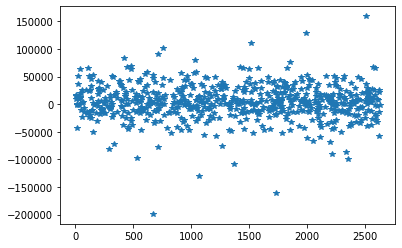

In [ ]:
skmodel_home = LinearRegression()
sk_fit = skmodel_home.fit(pr_train, re_train)
sk_predict = sk_fit.predict(pr_test)
plt.plot(sk_predict - re_test, '*')

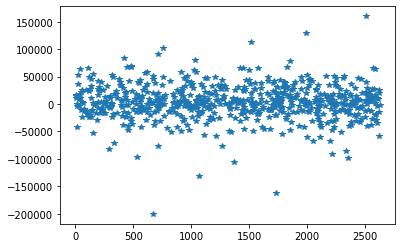

In [ ]:
model_home_pred = model_home.predict(pr_test)
plt.plot(model_home_pred - re_test, '*')

In [ ]:
model_home = sm.OLS(re_train,pr_train).fit()
model_home.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.974
Model:                            OLS   Adj. R-squared (uncentered):              0.973
Method:                 Least Squares   F-statistic:                              3297.
Date:                Tue, 29 Jun 2021   Prob (F-statistic):                        0.00
Time:                        20:36:14   Log-Likelihood:                         -23316.
No. Observations:                1977   AIC:                                  4.668e+04
Df Residuals:                    1955   BIC:                                  4.680e+04
Df Model:                          22                                                  
Covariance Type:            nonrobust                                                  
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Overall Qual    1.689e+04    860.974     19.620      0.000    1.52e+04    1.86e+04
Bsmt Full Bath  5225.4713   1886.305      2.770      0.006    1526.091    8924.851
Full Bath       1.919e+04   1684.832     11.388      0.000    1.59e+04    2.25e+04
Half Bath       1.611e+04   1674.490      9.619      0.000    1.28e+04    1.94e+04
dm_RM          -9819.9450   2137.030     -4.595      0.000    -1.4e+04   -5628.849
dm_NoRidge      5.373e+04   5155.341     10.422      0.000    4.36e+04    6.38e+04
dm_NridgHt      4.582e+04   3721.079     12.315      0.000    3.85e+04    5.31e+04
dm_StoneBr      5.746e+04   5442.882     10.557      0.000    4.68e+04    6.81e+04
dm_None         1.205e+04   2149.473      5.607      0.000    7836.792    1.63e+04
dm_PConc        5800.5174   1932.653      3.001      0.003    2010.241    9590.794
dm_No           -1.06e+04   1647.169     -6.435      0.000   -1.38e+04   -7368.482
dm_Fin          8119.9711   1959.758      4.143      0.000    4276.536     1.2e+04
dm_Partial      2.024e+04   2984.932      6.780      0.000    1.44e+04    2.61e+04
Year Remod/Add   206.9720     37.858      5.467      0.000     132.726     281.218
Mas Vnr Area      49.1749      6.140      8.009      0.000      37.134      61.216
BsmtFin SF 1      13.7409      2.428      5.659      0.000       8.979      18.503
Total Bsmt SF     22.3827      2.472      9.055      0.000      17.535      27.230
Fireplaces      1.113e+04   1321.675      8.422      0.000    8539.203    1.37e+04
Garage Yr Blt   -226.8280     37.782     -6.004      0.000    -300.926    -152.730
Garage Cars     3505.5664   2294.229      1.528      0.127    -993.826    8004.959
Garage Area       37.0162      7.964      4.648      0.000      21.397      52.635
Wood Deck SF      29.5730      5.998      4.930      0.000      17.809      41.336
==============================================================================
Omnibus:                      547.098   Durbin-Watson:                   2.045
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            47097.571
Skew:                          -0.199   Prob(JB):                         0.00
Kurtosis:                      26.908   Cond. No.                     2.43e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.43e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
print(model_home.pvalues, model_home.summary2)

Overall Qual      1.816097e-74
Bsmt Full Bath    1.113387e-03
Full Bath         5.798987e-02
Half Bath         1.404352e-03
dm_RM             2.032640e-07
dm_IR1            8.820261e-01
dm_Reg            6.829952e-01
dm_NoRidge        5.006436e-15
dm_NridgHt        8.847557e-34
dm_StoneBr        4.502262e-21
dm_Gable          3.860639e-01
dm_Hip            6.758776e-01
dm_None           2.072791e-05
dm_PConc          8.625769e-09
dm_No             4.274754e-08
dm_Attchd         8.602792e-01
dm_Detchd         4.213072e-01
dm_Fin            1.501429e-04
dm_New            2.332371e-01
dm_Partial        3.481583e-02
PID               8.236827e-01
Lot Frontage      7.828054e-01
Lot Area          1.082376e-01
Year Built        1.370570e-01
Year Remod/Add    9.192082e-05
Mas Vnr Area      1.117758e-10
BsmtFin SF 1      5.852229e-09
Total Bsmt SF     3.092558e-03
1st Flr SF        1.092282e-01
2nd Flr SF        2.379230e-01
Gr Liv Area       5.298615e-01
TotRms AbvGrd     9.835042e-01
Fireplac

In [ ]:
predict_var.drop(['dm_Reg', 'dm_IR1', 'dm_Gable', 'dm_Hip', 'dm_Attchd', 'dm_Detchd', 'dm_New', 'PID', 'Lot Frontage', 'Lot Area', 'Year Built', '1st Flr SF', '2nd Flr SF', 'Gr Liv Area', 'TotRms AbvGrd', 'Open Porch SF'],axis=1, inplace=True)

In [ ]:
predict_var["Lot Frontage"].min()*11

231.0

#####L. Reg. with statsmodel.

In [ ]:
pr_train, pr_test, re_train, re_test = train_test_split(predict_var,housing_data["SalePrice"],test_size=0.25,random_state=0)

In [ ]:
model_home = sm.OLS(re_train,pr_train).fit()
model_home.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.977
Model:                            OLS   Adj. R-squared (uncentered):              0.976
Method:                 Least Squares   F-statistic:                              2158.
Date:                Tue, 29 Jun 2021   Prob (F-statistic):                        0.00
Time:                        19:53:59   Log-Likelihood:                         -23190.
No. Observations:                1977   AIC:                                  4.646e+04
Df Residuals:                    1939   BIC:                                  4.667e+04
Df Model:                          38                                                  
Covariance Type:            nonrobust                                                  
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Overall Qual    1.626e+04    852.331     19.073      0.000    1.46e+04    1.79e+04
Bsmt Full Bath  5832.7154   1786.392      3.265      0.001    2329.265    9336.166
Full Bath       3746.6584   1975.150      1.897      0.058    -126.983    7620.300
Half Bath       6390.6771   1998.102      3.198      0.001    2472.022    1.03e+04
dm_RM          -1.219e+04   2336.647     -5.215      0.000   -1.68e+04   -7603.352
dm_IR1           607.1263   4090.574      0.148      0.882   -7415.259    8629.511
dm_Reg         -1671.6602   4092.785     -0.408      0.683   -9698.381    6355.061
dm_NoRidge      3.999e+04   5068.477      7.890      0.000    3.01e+04    4.99e+04
dm_NridgHt       4.47e+04   3619.683     12.349      0.000    3.76e+04    5.18e+04
dm_StoneBr      5.048e+04   5297.242      9.530      0.000    4.01e+04    6.09e+04
dm_Gable       -4394.6799   5068.991     -0.867      0.386   -1.43e+04    5546.565
dm_Hip          2222.9454   5316.037      0.418      0.676   -8202.803    1.26e+04
dm_None         8943.1917   2095.691      4.267      0.000    4833.148    1.31e+04
dm_PConc         1.11e+04   1919.309      5.781      0.000    7331.733    1.49e+04
dm_No          -9035.8108   1642.547     -5.501      0.000   -1.23e+04   -5814.467
dm_Attchd       -405.9437   2305.945     -0.176      0.860   -4928.336    4116.449
dm_Detchd      -2132.5516   2651.352     -0.804      0.421   -7332.351    3067.248
dm_Fin          7160.7197   1885.214      3.798      0.000    3463.460    1.09e+04
dm_New         -2.629e+04    2.2e+04     -1.192      0.233   -6.95e+04    1.69e+04
dm_Partial      4.615e+04   2.19e+04      2.112      0.035    3294.873     8.9e+04
PID              9.83e-07   4.41e-06      0.223      0.824   -7.67e-06    9.63e-06
Lot Frontage     -10.9380     39.673     -0.276      0.783     -88.744      66.868
Lot Area           0.1835      0.114      1.607      0.108      -0.040       0.408
Year Built       -67.2218     45.192     -1.487      0.137    -155.853      21.409
Year Remod/Add   157.9761     40.308      3.919      0.000      78.924     237.028
Mas Vnr Area      38.2735      5.901      6.486      0.000      26.700      49.847
BsmtFin SF 1      13.5571      2.319      5.847      0.000       9.010      18.104
Total Bsmt SF      9.0416      3.052      2.962      0.003       3.055      15.028
1st Flr SF        28.9340     18.057      1.602      0.109      -6.478      64.346
2nd Flr SF        21.1156     17.886      1.181      0.238     -13.962      56.194
Gr Liv Area       11.1521     17.749      0.628      0.530     -23.657      45.961
TotRms AbvGrd     16.0841    777.816      0.021      0.984   -1509.360    1541.528
Fireplaces      5542.7948   1305.183      4.247      0.000    2983.084    8102.

In [ ]:
model_home.pvalues

const              6.553572e-01
Unnamed: 0         2.712517e-01
Unnamed: 0.1       2.712462e-01
PID                5.762358e-03
Lot Frontage       8.606535e-01
Lot Area           8.036141e-01
Year Built         7.585276e-09
Year Remod/Add     1.487151e-19
Mas Vnr Area       8.406812e-15
BsmtFin SF 1       7.309855e-19
BsmtFin SF 2       1.739389e-01
Bsmt Unf SF        3.245454e-01
Total Bsmt SF      1.371370e-18
1st Flr SF         4.060267e-08
2nd Flr SF         1.579718e-07
Low Qual Fin SF    4.128196e-02
Gr Liv Area        9.334854e-08
Bedroom AbvGr      1.800743e-17
Kitchen AbvGr      2.651027e-17
TotRms AbvGrd      2.151096e-09
Fireplaces         1.453702e-05
Garage Yr Blt      2.144509e-02
Garage Cars        4.539191e-07
Garage Area        3.310417e-01
Wood Deck SF       1.370790e-04
Open Porch SF      5.894753e-01
Enclosed Porch     2.353562e-01
3Ssn Porch         4.847671e-01
Screen Porch       2.849974e-02
Pool Area          8.737489e-03
Misc Val           7.139540e-01
Mo Sold 

In [ ]:
predictors2 = housing_cont.copy()
predictors = sm.add_constant(predictors2) 

In [ ]:
predictors.drop(['Unnamed: 0','Unnamed: 0.1', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1', 'Total Bsmt SF', 'Bedroom AbvGr', 'Kitchen AbvGr'],axis=1,inplace=True)

In [ ]:
predictors2 = housing_cont.copy()
predictors = sm.add_constant(predictors2) 
predictors.drop(['const','Unnamed: 0','Unnamed: 0.1', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1'],axis=1,inplace=True)

In [ ]:
pr_train, pr_test, re_train, re_test = train_test_split(predictors,housing_saleprice,test_size=0.25,random_state=0)

In [ ]:
model_home.pvalues

PID                6.278604e-03
Lot Frontage       8.239250e-01
Lot Area           8.131111e-01
Year Built         5.851668e-09
Year Remod/Add     1.672063e-19
Mas Vnr Area       6.272449e-15
BsmtFin SF 1       6.783340e-19
BsmtFin SF 2       1.757529e-01
Bsmt Unf SF        3.300585e-01
Total Bsmt SF      1.505319e-18
1st Flr SF         4.661438e-08
2nd Flr SF         1.819369e-07
Low Qual Fin SF    4.352663e-02
Gr Liv Area        8.958573e-08
Bedroom AbvGr      1.875161e-17
Kitchen AbvGr      1.817444e-17
TotRms AbvGrd      1.991327e-09
Fireplaces         1.468955e-05
Garage Yr Blt      1.906732e-02
Garage Cars        3.726110e-07
Garage Area        3.523365e-01
Wood Deck SF       1.591782e-04
Open Porch SF      6.217325e-01
Enclosed Porch     2.332056e-01
3Ssn Porch         5.174960e-01
Screen Porch       3.003778e-02
Pool Area          1.061592e-02
Misc Val           7.062313e-01
Mo Sold            3.730711e-01
Yr Sold            1.957777e-61
dtype: float64

In [ ]:
model_home = sm.OLS(re_train,pr_train).fit()
model_home.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.968
Model:                            OLS   Adj. R-squared (uncentered):              0.967
Method:                 Least Squares   F-statistic:                              2096.
Date:                Mon, 28 Jun 2021   Prob (F-statistic):                        0.00
Time:                        20:19:52   Log-Likelihood:                         -23516.
No. Observations:                1977   AIC:                                  4.709e+04
Df Residuals:                    1949   BIC:                                  4.725e+04
Df Model:                          28                                                  
Covariance Type:            nonrobust                                                  
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
PID             -1.282e-05   4.69e-06     -2.736      0.006    -2.2e-05   -3.63e-06
Lot Frontage       10.0551     45.186      0.223      0.824     -78.562      98.672
Lot Area           -0.0300      0.127     -0.236      0.813      -0.279       0.219
Year Built        292.6293     50.047      5.847      0.000     194.478     390.781
Year Remod/Add    490.3869     53.715      9.129      0.000     385.042     595.732
Mas Vnr Area       41.6569      5.299      7.861      0.000      31.264      52.050
BsmtFin SF 1       17.0669      1.903      8.970      0.000      13.335      20.798
BsmtFin SF 2        4.8728      3.598      1.354      0.176      -2.183      11.928
Bsmt Unf SF         1.7394      1.785      0.974      0.330      -1.762       5.241
Total Bsmt SF      23.6791      2.667      8.878      0.000      18.448      28.910
1st Flr SF         33.0432      6.024      5.485      0.000      21.229      44.857
2nd Flr SF         28.9464      5.529      5.236      0.000      18.104      39.789
Low Qual Fin SF   -31.6987     15.693     -2.020      0.044     -62.475      -0.922
Gr Liv Area        30.2909      5.644      5.367      0.000      19.222      41.360
Bedroom AbvGr    -1.24e+04   1445.285     -8.582      0.000   -1.52e+04   -9568.705
Kitchen AbvGr   -3.711e+04   4322.093     -8.586      0.000   -4.56e+04   -2.86e+04
TotRms AbvGrd    6485.0759   1075.989      6.027      0.000    4374.866    8595.286
Fireplaces       6669.8487   1535.307      4.344      0.000    3658.833    9680.864
Garage Yr Blt     131.1225     55.888      2.346      0.019      21.516     240.729
Garage Cars       1.28e+04   2510.496      5.100      0.000    7879.960    1.77e+04
Garage Area         8.2780      8.898      0.930      0.352      -9.173      25.729
Wood Deck SF       25.7768      6.813      3.784      0.000      12.416      39.138
Open Porch SF      -6.4277     13.025     -0.493      0.622     -31.973      19.117
Enclosed Porch     17.2677     14.480      1.193      0.233     -11.130      45.666
3Ssn Porch         22.2707     34.404      0.647      0.517     -45.202      89.743
Screen Porch       32.6088     15.019      2.171      0.030       3.154      62.064
Pool Area         -55.5681     21.727     -2.558      0.011     -98.179     -12.958
Misc Val           -0.7462      1.979     -0.377      0.706      -4.628       3.136
Mo Sold           265.1692    297.628      0.891      0.373    -318.534     848.873
Yr Sold          -873.2051     50.952    -17.138      0.000    -973.132    -773.279
==============================================================================
Omnibus:                     1165.959   Durbin-Watson:                   2.073
Prob(Omnibus):                  0.000   Jarque-Bera (J

In [ ]:
predictors.columns

Index(['const', 'Unnamed: 0', 'Unnamed: 0.1', 'PID', 'Lot Frontage',
       'Lot Area', 'Year Built', 'BsmtFin SF 2', 'Bsmt Unf SF', '1st Flr SF',
       '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'TotRms AbvGrd',
       'Fireplaces', 'Garage Yr Blt', 'Garage Cars', 'Garage Area',
       'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch', '3Ssn Porch',
       'Screen Porch', 'Pool Area', 'Misc Val', 'Mo Sold', 'Yr Sold'],
      dtype='object')

remove: Year Remod/Add, Mas Vnr Area, BsmtFin SF 1, Total Bsmt SF, Bedroom AbvGr, Kitchen AbvGr, 

In [ ]:
housing_cont.iloc[[1,2,3,4,6]].columns

#LM loop

In [ ]:
housing_cat.columns

Index(['MS Zoning', 'Street', 'Alley', 'Lot Shape', 'Land Contour',
       'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
       'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl',
       'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Exter Qual',
       'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure',
       'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating', 'Heating QC',
       'Central Air', 'Electrical', 'Kitchen Qual', 'Functional',
       'Fireplace Qu', 'Garage Type', 'Garage Finish', 'Garage Qual',
       'Garage Cond', 'Paved Drive', 'Pool QC', 'Fence', 'Misc Feature',
       'Sale Type', 'Sale Condition', 'MS SubClass', 'Overall Qual',
       'Overall Cond', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath',
       'Half Bath'],
      dtype='object')

In [ ]:
sel_pred = housing_cont.columns
housing_saleprice = housing_data["SalePrice"]

In [ ]:
comb_8 = combinations(['PID', 'Lot Frontage', 'Lot Area', 'Year Built', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', '1st Flr SF', '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt', 'Garage Cars', 'Garage Area', 'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch', '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val', 'Mo Sold', 'Yr Sold'],8)

In [ ]:
for i in list(comb_8):
  print(i)


Streaming output truncated to the last 5000 lines.
('PID', 'Lot Area', 'Mas Vnr Area', '1st Flr SF', 'Garage Yr Blt', 'Garage Area', 'Enclosed Porch', 'Yr Sold')
('PID', 'Lot Area', 'Mas Vnr Area', '1st Flr SF', 'Garage Yr Blt', 'Garage Area', '3Ssn Porch', 'Screen Porch')
('PID', 'Lot Area', 'Mas Vnr Area', '1st Flr SF', 'Garage Yr Blt', 'Garage Area', '3Ssn Porch', 'Pool Area')
('PID', 'Lot Area', 'Mas Vnr Area', '1st Flr SF', 'Garage Yr Blt', 'Garage Area', '3Ssn Porch', 'Misc Val')
('PID', 'Lot Area', 'Mas Vnr Area', '1st Flr SF', 'Garage Yr Blt', 'Garage Area', '3Ssn Porch', 'Mo Sold')
('PID', 'Lot Area', 'Mas Vnr Area', '1st Flr SF', 'Garage Yr Blt', 'Garage Area', '3Ssn Porch', 'Yr Sold')
('PID', 'Lot Area', 'Mas Vnr Area', '1st Flr SF', 'Garage Yr Blt', 'Garage Area', 'Screen Porch', 'Pool Area')
('PID', 'Lot Area', 'Mas Vnr Area', '1st Flr SF', 'Garage Yr Blt', 'Garage Area', 'Screen Porch', 'Misc Val')
('PID', 'Lot Area', 'Mas Vnr Area', '1st Flr SF', 'Garage Yr Blt', 'Garage

KeyboardInterrupt: ignored

In [ ]:
for i in list(comb_8):
  pr_train, pr_test, re_train, re_test = train_test_split(predictors_sel[i],housing_saleprice,test_size=0.25,random_state=0)
  model_home = sm.OLS(re_train,pr_train).fit()
  print(model_home.summary())

In [ ]:
comb_8

In [ ]:
comb_list

[]

In [ ]:
pr_train, pr_test, re_train, re_test = train_test_split(predictors_sel.pop("PID"),housing_saleprice,test_size=0.25,random_state=0)

In [ ]:
model_home = sm.OLS(re_train,pr_train).fit()
model_home.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.968
Model:                            OLS   Adj. R-squared (uncentered):              0.967
Method:                 Least Squares   F-statistic:                              2096.
Date:                Mon, 28 Jun 2021   Prob (F-statistic):                        0.00
Time:                        18:35:16   Log-Likelihood:                         -23516.
No. Observations:                1977   AIC:                                  4.709e+04
Df Residuals:                    1949   BIC:                                  4.725e+04
Df Model:                          28                                                  
Covariance Type:            nonrobust                                                  
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
PID             -1.282e-05   4.69e-06     -2.736      0.006    -2.2e-05   -3.63e-06
Lot Frontage       10.0551     45.186      0.223      0.824     -78.562      98.672
Lot Area           -0.0300      0.127     -0.236      0.813      -0.279       0.219
Year Built        292.6293     50.047      5.847      0.000     194.478     390.781
Year Remod/Add    490.3869     53.715      9.129      0.000     385.042     595.732
Mas Vnr Area       41.6569      5.299      7.861      0.000      31.264      52.050
BsmtFin SF 1       17.0669      1.903      8.970      0.000      13.335      20.798
BsmtFin SF 2        4.8728      3.598      1.354      0.176      -2.183      11.928
Bsmt Unf SF         1.7394      1.785      0.974      0.330      -1.762       5.241
Total Bsmt SF      23.6791      2.667      8.878      0.000      18.448      28.910
1st Flr SF         33.0432      6.024      5.485      0.000      21.229      44.857
2nd Flr SF         28.9464      5.529      5.236      0.000      18.104      39.789
Low Qual Fin SF   -31.6987     15.693     -2.020      0.044     -62.475      -0.922
Gr Liv Area        30.2909      5.644      5.367      0.000      19.222      41.360
Bedroom AbvGr    -1.24e+04   1445.285     -8.582      0.000   -1.52e+04   -9568.705
Kitchen AbvGr   -3.711e+04   4322.093     -8.586      0.000   -4.56e+04   -2.86e+04
TotRms AbvGrd    6485.0759   1075.989      6.027      0.000    4374.866    8595.286
Fireplaces       6669.8487   1535.307      4.344      0.000    3658.833    9680.864
Garage Yr Blt     131.1225     55.888      2.346      0.019      21.516     240.729
Garage Cars       1.28e+04   2510.496      5.100      0.000    7879.960    1.77e+04
Garage Area         8.2780      8.898      0.930      0.352      -9.173      25.729
Wood Deck SF       25.7768      6.813      3.784      0.000      12.416      39.138
Open Porch SF      -6.4277     13.025     -0.493      0.622     -31.973      19.117
Enclosed Porch     17.2677     14.480      1.193      0.233     -11.130      45.666
3Ssn Porch         22.2707     34.404      0.647      0.517     -45.202      89.743
Screen Porch       32.6088     15.019      2.171      0.030       3.154      62.064
Pool Area         -55.5681     21.727     -2.558      0.011     -98.179     -12.958
Misc Val           -0.7462      1.979     -0.377      0.706      -4.628       3.136
Mo Sold           265.1692    297.628      0.891      0.373    -318.534     848.873
Yr Sold          -873.2051     50.952    -17.138      0.000    -973.132    -773.279
==============================================================================
Omnibus:                     1165.959   Durbin-Watson:                   2.073
Prob(Omnibus):                  0.000   Jarque-Bera (J

In [ ]:
#sel_pred = list(housing_cont.columns)
predictors_sel = housing_cont[sel_pred]

In [ ]:
sel_pred.drop('Unnamed: 0.1')

Index(['Unnamed: 0', 'PID', 'Lot Frontage', 'Lot Area', 'Year Built',
       'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1', 'BsmtFin SF 2',
       'Bsmt Unf SF', 'Total Bsmt SF', '1st Flr SF', '2nd Flr SF',
       'Low Qual Fin SF', 'Gr Liv Area', 'Bedroom AbvGr', 'Kitchen AbvGr',
       'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt', 'Garage Cars',
       'Garage Area', 'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch',
       '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val', 'Mo Sold',
       'Yr Sold'],
      dtype='object')

In [ ]:
for i in ['PID', 'Lot Frontage', 'Lot Area', 'Year Built', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', '1st Flr SF', '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt', 'Garage Cars', 'Garage Area', 'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch', '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val', 'Mo Sold', 'Yr Sold']:
  pr_train, pr_test, re_train, re_test = train_test_split(predictors_sel.drop(str(f"{i}"),axis=1),housing_saleprice,test_size=0.25,random_state=0)
  model_home = sm.OLS(re_train,pr_train).fit()
  print(model_home.summary())

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.968
Model:                            OLS   Adj. R-squared (uncentered):              0.967
Method:                 Least Squares   F-statistic:                              2089.
Date:                Mon, 28 Jun 2021   Prob (F-statistic):                        0.00
Time:                        18:51:54   Log-Likelihood:                         -23520.
No. Observations:                1977   AIC:                                  4.710e+04
Df Residuals:                    1949   BIC:                                  4.725e+04
Df Model:                          28                                                  
Covariance Type:            nonrobust                                                  
                      coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

In [ ]:
for i in ['PID', 'Lot Frontage', 'Lot Area', 'Year Built', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', '1st Flr SF', '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt', 'Garage Cars', 'Garage Area', 'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch', '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val', 'Mo Sold', 'Yr Sold']:
  pr_train, pr_test, re_train, re_test = train_test_split(predictors_sel.drop(str(f"{i}"),axis=1),housing_saleprice,test_size=0.25,random_state=0)
  model_home = sm.OLS(re_train,pr_train).fit()
  print(model_home.summary())

In [ ]:
pr_train, pr_test, re_train, re_test = train_test_split(predictors_sel.pop("PID"),housing_saleprice,test_size=0.25,random_state=0)

In [ ]:
model_home = sm.OLS(re_train,pr_train).fit()
model_home.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.968
Model:                            OLS   Adj. R-squared (uncentered):              0.967
Method:                 Least Squares   F-statistic:                              2096.
Date:                Mon, 28 Jun 2021   Prob (F-statistic):                        0.00
Time:                        18:35:16   Log-Likelihood:                         -23516.
No. Observations:                1977   AIC:                                  4.709e+04
Df Residuals:                    1949   BIC:                                  4.725e+04
Df Model:                          28                                                  
Covariance Type:            nonrobust                                                  
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
PID             -1.282e-05   4.69e-06     -2.736      0.006    -2.2e-05   -3.63e-06
Lot Frontage       10.0551     45.186      0.223      0.824     -78.562      98.672
Lot Area           -0.0300      0.127     -0.236      0.813      -0.279       0.219
Year Built        292.6293     50.047      5.847      0.000     194.478     390.781
Year Remod/Add    490.3869     53.715      9.129      0.000     385.042     595.732
Mas Vnr Area       41.6569      5.299      7.861      0.000      31.264      52.050
BsmtFin SF 1       17.0669      1.903      8.970      0.000      13.335      20.798
BsmtFin SF 2        4.8728      3.598      1.354      0.176      -2.183      11.928
Bsmt Unf SF         1.7394      1.785      0.974      0.330      -1.762       5.241
Total Bsmt SF      23.6791      2.667      8.878      0.000      18.448      28.910
1st Flr SF         33.0432      6.024      5.485      0.000      21.229      44.857
2nd Flr SF         28.9464      5.529      5.236      0.000      18.104      39.789
Low Qual Fin SF   -31.6987     15.693     -2.020      0.044     -62.475      -0.922
Gr Liv Area        30.2909      5.644      5.367      0.000      19.222      41.360
Bedroom AbvGr    -1.24e+04   1445.285     -8.582      0.000   -1.52e+04   -9568.705
Kitchen AbvGr   -3.711e+04   4322.093     -8.586      0.000   -4.56e+04   -2.86e+04
TotRms AbvGrd    6485.0759   1075.989      6.027      0.000    4374.866    8595.286
Fireplaces       6669.8487   1535.307      4.344      0.000    3658.833    9680.864
Garage Yr Blt     131.1225     55.888      2.346      0.019      21.516     240.729
Garage Cars       1.28e+04   2510.496      5.100      0.000    7879.960    1.77e+04
Garage Area         8.2780      8.898      0.930      0.352      -9.173      25.729
Wood Deck SF       25.7768      6.813      3.784      0.000      12.416      39.138
Open Porch SF      -6.4277     13.025     -0.493      0.622     -31.973      19.117
Enclosed Porch     17.2677     14.480      1.193      0.233     -11.130      45.666
3Ssn Porch         22.2707     34.404      0.647      0.517     -45.202      89.743
Screen Porch       32.6088     15.019      2.171      0.030       3.154      62.064
Pool Area         -55.5681     21.727     -2.558      0.011     -98.179     -12.958
Misc Val           -0.7462      1.979     -0.377      0.706      -4.628       3.136
Mo Sold           265.1692    297.628      0.891      0.373    -318.534     848.873
Yr Sold          -873.2051     50.952    -17.138      0.000    -973.132    -773.279
==============================================================================
Omnibus:                     1165.959   Durbin-Watson:                   2.073
Prob(Omnibus):                  0.000   Jarque-Bera (J

In [ ]:
model_home.pvalues

##Regularization (Ridge Regression, LASSO Regression)

######LASSO Regression.

{'boxes': [<matplotlib.lines.Line2D at 0x7f194cae00d0>],
 'caps': [<matplotlib.lines.Line2D at 0x7f194cae6190>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f194caee1d0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f194cae6c50>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f194cae06d0>,
  <matplotlib.lines.Line2D at 0x7f194cae0c10>]}

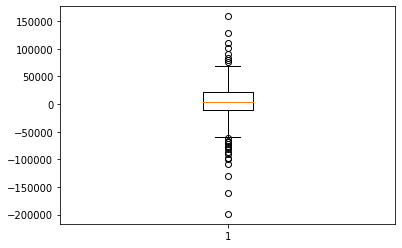

In [ ]:
plt.boxplot(predict_house - re_test)

In [ ]:
plt.plot(predict_house - re_test, '.')

In [ ]:
pr_train, pr_test, re_train, re_test = train_test_split(predict_var,housing_data["SalePrice"],test_size=0.25,random_state=0)

In [ ]:
house_model_lso = Lasso(alpha=1,normalize=True)
house_model_lso.fit(pr_train,re_train)
predict_house = house_model_lso.predict(pr_test)
rmspe = (np.sqrt(np.mean(np.square((predict_house - re_test) / re_test))))

In [ ]:
rmspe

0.28389810535512766

In [ ]:
rsq_list = []
name_list = []
for name in pre_corr_sq.index:
  if pre_corr_sq[name] > 0.00986201164132551:
    rsq_list.append(pre_corr_sq[name])
    name_list.append(name)
    print(name)
rsq_df = pd.DataFrame({'var_name' : name_list, 'rsquare' : rsq_list})

Overall Qual
Bsmt Full Bath
Full Bath
Half Bath
dm_C (all)
dm_FV
dm_RL
dm_RM
dm_IR1
dm_IR2
dm_Reg
dm_HLS
dm_CulDSac
dm_BrkSide
dm_Edwards
dm_IDOTRR
dm_MeadowV
dm_NAmes
dm_NoRidge
dm_NridgHt
dm_OldTown
dm_Sawyer
dm_Somerst
dm_StoneBr
dm_Timber
dm_1Fam
dm_2fmCon
dm_Twnhs
dm_1.5Fin
dm_2Story
dm_Gable
dm_Hip
dm_CemntBd
dm_CmentBd
dm_None
dm_BrkTil
dm_PConc
dm_Slab
dm_Av
dm_No
dm_FuseA
dm_FuseF
dm_SBrkr
dm_Typ
dm_Attchd
dm_BuiltIn
dm_Detchd
dm_Fin
dm_RFn
dm_MnPrv
dm_COD
dm_New
dm_WD 
dm_Abnorml
dm_Normal
dm_Partial
PID
Lot Frontage
Lot Area
Year Built
Year Remod/Add
Mas Vnr Area
BsmtFin SF 1
Bsmt Unf SF
Total Bsmt SF
1st Flr SF
2nd Flr SF
Gr Liv Area
Bedroom AbvGr
Kitchen AbvGr
TotRms AbvGrd
Fireplaces
Garage Yr Blt
Garage Cars
Garage Area
Wood Deck SF
Open Porch SF
Enclosed Porch


In [ ]:
len(rsq_list)

78

In [ ]:
sor_pre_corr = pd.Series(sorted(pre_corr, reverse=True,),index=pre_corr.index)

In [ ]:
sor_pre_corr[60:120]

dm_1Fam       0.040625
dm_2fmCon     0.035193
dm_Duplex     0.034582
dm_Twnhs      0.033023
dm_TwnhsE     0.030654
dm_1.5Fin     0.029951
dm_1.5Unf     0.028249
dm_1Story     0.025925
dm_2.5Fin     0.025925
dm_2.5Unf     0.024750
dm_2Story     0.022056
dm_SFoyer     0.018112
dm_SLvl       0.017417
dm_Flat       0.015681
dm_Gable      0.015303
dm_Gambrel    0.014513
dm_Hip        0.011068
dm_Mansard    0.010878
dm_ClyTile    0.009543
dm_CompShg    0.009470
dm_Membran    0.008097
dm_Metal      0.005816
dm_Roll       0.005073
dm_Tar&Grv    0.000003
dm_WdShake   -0.004778
dm_WdShngl   -0.004972
dm_BrkComm   -0.007874
dm_CemntBd   -0.009736
dm_WdShing   -0.010240
dm_Brk Cmn   -0.010569
dm_CmentBd   -0.010694
dm_Other     -0.010694
dm_Wd Shng   -0.010694
dm_BrkCmn    -0.012128
dm_None      -0.012566
dm_BrkTil    -0.016375
dm_PConc     -0.016670
dm_Slab      -0.017307
dm_Wood      -0.018781
dm_Av        -0.019085
dm_Mn        -0.019955
dm_No        -0.021115
dm_Floor     -0.026619
dm_GasA    

In [ ]:
housing_saleprice = housing_data["SalePrice"]
col_nam = housing_cat_dm.columns
pre_corr = pd.Series()
for i in list(col_nam):
  print(i)
  print(np.corrcoef(housing_cat_dm.loc[:,f"{i}"], housing_saleprice)[1,0])
  pre_corr[i] = np.corrcoef(housing_cat_dm.loc[:,f"{i}"], housing_saleprice)[1,0]

In [ ]:
sor_pre_corr = pd.Series(sorted(pre_corr, reverse=True,),index=pre_corr.index)

In [ ]:
sor_pre_corr[45]**2

In [ ]:
try_list = rsq_list

In [ ]:
predict_var.columns

Index(['Overall Qual', 'Bsmt Full Bath', 'Full Bath', 'Half Bath',
       'dm_C (all)', 'dm_FV', 'dm_RL', 'dm_RM', 'dm_IR1', 'dm_IR2', 'dm_Reg',
       'dm_HLS', 'dm_CulDSac', 'dm_BrkSide', 'dm_Edwards', 'dm_IDOTRR',
       'dm_MeadowV', 'dm_NAmes', 'dm_NoRidge', 'dm_NridgHt', 'dm_OldTown',
       'dm_Sawyer', 'dm_Somerst', 'dm_StoneBr', 'dm_Timber', 'dm_1Fam',
       'dm_2fmCon', 'dm_Twnhs', 'dm_1.5Fin', 'dm_2Story', 'dm_Gable', 'dm_Hip',
       'dm_CemntBd', 'dm_CmentBd', 'dm_None', 'dm_BrkTil', 'dm_PConc',
       'dm_Slab', 'dm_Av', 'dm_No', 'dm_FuseA', 'dm_FuseF', 'dm_SBrkr',
       'dm_Typ', 'dm_Attchd', 'dm_BuiltIn', 'dm_Detchd', 'dm_Fin', 'dm_RFn',
       'dm_MnPrv', 'dm_COD', 'dm_New', 'dm_WD ', 'dm_Abnorml', 'dm_Normal',
       'dm_Partial', 'PID', 'Lot Frontage', 'Lot Area', 'Year Built',
       'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1', 'Bsmt Unf SF',
       'Total Bsmt SF', '1st Flr SF', '2nd Flr SF', 'Gr Liv Area',
       'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms Ab

In [ ]:
name = []
valu = []

for i in range(78):
  if rsq_df.loc[i,'rsquare'] > 0.06:
    name.append( rsq_df.iloc[i,0])
    valu.append( rsq_df.iloc[i,1])
    print(rsq_df.iloc[i])
rsq_df_sel = pd.DataFrame(valu,name)

          var_name   rsquare
0     Overall Qual  0.648051
1   Bsmt Full Bath  0.076762
2        Full Bath  0.294182
3        Half Bath  0.082405
4       dm_C (all)  0.015673
..             ...       ...
73     Garage Cars  0.418804
74     Garage Area  0.401800
75    Wood Deck SF  0.103722
76   Open Porch SF  0.096324
77  Enclosed Porch  0.020075

[78 rows x 2 columns]
var_name    Overall Qual
rsquare         0.648051
Name: 0, dtype: object
var_name    Bsmt Full Bath
rsquare          0.0767624
Name: 1, dtype: object
var_name    Full Bath
rsquare      0.294182
Name: 2, dtype: object
var_name    Half Bath
rsquare     0.0824052
Name: 3, dtype: object
var_name       dm_RM
rsquare     0.084821
Name: 7, dtype: object
var_name       dm_IR1
rsquare     0.0755096
Name: 8, dtype: object
var_name       dm_Reg
rsquare     0.0939868
Name: 10, dtype: object
var_name    dm_NoRidge
rsquare      0.0850422
Name: 18, dtype: object
var_name    dm_NridgHt
rsquare       0.189875
Name: 19, dtype: object
var_n

In [ ]:
rsq_df_sel.index

Index(['Overall Qual', 'Bsmt Full Bath', 'Full Bath', 'Half Bath', 'dm_RM',
       'dm_IR1', 'dm_Reg', 'dm_NoRidge', 'dm_NridgHt', 'dm_StoneBr',
       'dm_Gable', 'dm_Hip', 'dm_None', 'dm_PConc', 'dm_No', 'dm_Attchd',
       'dm_Detchd', 'dm_Fin', 'dm_New', 'dm_Partial', 'PID', 'Lot Frontage',
       'Lot Area', 'Year Built', 'Year Remod/Add', 'Mas Vnr Area',
       'BsmtFin SF 1', 'Total Bsmt SF', '1st Flr SF', '2nd Flr SF',
       'Gr Liv Area', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt',
       'Garage Cars', 'Garage Area', 'Wood Deck SF', 'Open Porch SF'],
      dtype='object')

In [ ]:
predict_var = predict_var[rsq_df_sel.index]

In [ ]:
predict_var.to_csv(("/drive/My Drive/project2/predicted_var.csv"))

In [ ]:
predict_var['Overall Qual'] = housing_combined['Overall Qual']

In [ ]:
full model
r**2  0.977
BIC: 	4.646e+04
BIC: 	4.667e+04


model: ['Overall Qual', 'Bsmt Full Bath', 'Full Bath', 'Half Bath', 'dm_RM', 'dm_NoRidge', 'dm_NridgHt', 'dm_StoneBr', 'dm_None', 
       'dm_PConc', 'dm_No', 'dm_Fin', 'dm_Partial', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1', 'Total Bsmt SF', 'Fireplaces', 
       'Garage Yr Blt', 'Garage Cars', 'Garage Area', 'Wood Deck SF']
r**2  0.974
AIC: 	4.668e+04
BIC: 	4.680e+04

r**2  
AIC: 	
BIC: 	

r**2  
AIC: 	
BIC:

In [ ]:
rmse = np.sqrt(np.mean(np.square((sk_predict - re_test)/re_test)))
print(rmse)

0.21789482460098394


In [ ]:
pr_train, pr_test, re_train, re_test = train_test_split(predict_var2,housing_data["SalePrice"],test_size=0.25,random_state=0)

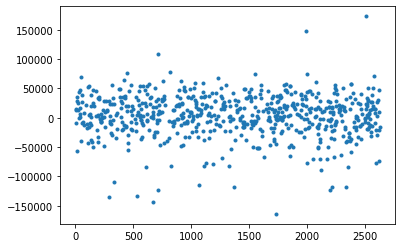

In [ ]:
sk_pred_home = LinearRegression()
sk_pred_fit = sk_pred_home.fit(pr_train, re_train)
sk_pred = sk_pred_fit.predict(pr_test)
plt.plot(sk_pred - re_test, '.')

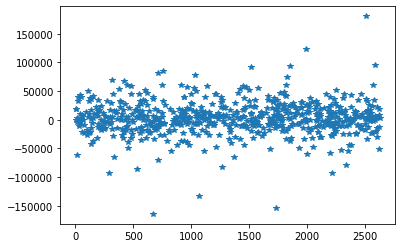

In [ ]:
pred_out = 

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.960
Model:                            OLS   Adj. R-squared (uncentered):              0.960
Method:                 Least Squares   F-statistic:                              7923.
Date:                Wed, 30 Jun 2021   Prob (F-statistic):                        0.00
Time:                        04:53:41   Log-Likelihood:                         -23728.
No. Observations:                1977   AIC:                                  4.747e+04
Df Residuals:                    1971   BIC:                                  4.750e+04
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------

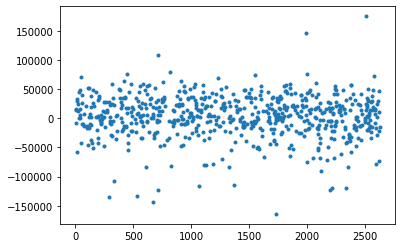

In [ ]:
model_home = sm.OLS(re_train,pr_train).fit()
model_home_pred= model_home.predict(pr_test)
print(model_home.summary())
plt.plot(model_home_pred-re_test, '.')

In [ ]:
type(model_home_pred)

pandas.core.series.Series

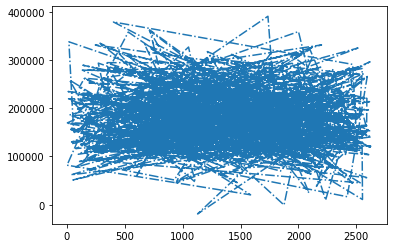

In [ ]:
plt.plot(model_home_pred, '-.')

In [ ]:
predict_var2 = predict_var[['Overall Qual', 'Full Bath', 'Half Bath', 'Total Bsmt SF', 'Garage Area', 'Garage Yr Blt']]

In [ ]:
print(model_home.pvalues)

Unnamed: 0        5.093343e-02
Overall Qual      2.149735e-74
Bsmt Full Bath    9.361023e-04
Full Bath         6.007183e-02
Half Bath         1.549798e-03
dm_RM             1.650718e-07
dm_IR1            9.313994e-01
dm_Reg            6.320264e-01
dm_NoRidge        3.343584e-15
dm_NridgHt        3.439105e-34
dm_StoneBr        2.975497e-21
dm_Gable          4.170352e-01
dm_Hip            6.121907e-01
dm_None           2.839558e-05
dm_PConc          1.107481e-08
dm_No             5.462768e-08
dm_Attchd         9.039721e-01
dm_Detchd         4.717209e-01
dm_Fin            1.872675e-04
dm_New            2.484867e-01
dm_Partial        3.791810e-02
PID               8.315058e-01
Lot Frontage      7.074015e-01
Lot Area          1.057564e-01
Year Built        1.310516e-01
Year Remod/Add    8.078186e-05
Mas Vnr Area      2.196982e-10
BsmtFin SF 1      8.507237e-09
Total Bsmt SF     2.969538e-03
1st Flr SF        9.746071e-02
2nd Flr SF        2.146023e-01
Gr Liv Area       5.594806e-01
TotRms A

In [ ]:
pr_train, pr_test, re_train, re_test = train_test_split(predictors_sel.pop("PID"),housing_saleprice,test_size=0.25,random_state=0)

In [ ]:
model_home.pvalues

##Regularization (Ridge Regression, LASSO Regression)

######LASSO Regression.

{'boxes': [<matplotlib.lines.Line2D at 0x7f194cae00d0>],
 'caps': [<matplotlib.lines.Line2D at 0x7f194cae6190>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f194caee1d0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f194cae6c50>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f194cae06d0>,
  <matplotlib.lines.Line2D at 0x7f194cae0c10>]}

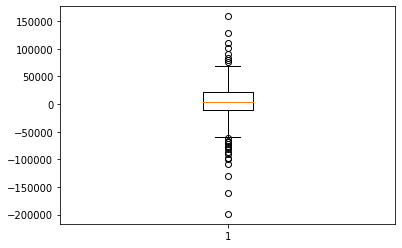

In [ ]:
plt.boxplot(predict_house - re_test)

#Import Libraries.

In [ ]:
plt.plot(predict_house - re_test, '.')

In [13]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import itertools
from sklearn import preprocessing
from itertools import combinations
from sklearn import datasets
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from IPython.display import Image
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from google.colab import drive
drive.mount('/drive')

Drive already mounted at /drive; to attempt to forcibly remount, call drive.mount("/drive", force_remount=True).


#Import Data

In [23]:
housing_data = pd.read_csv("/drive/My Drive/Cohort_5/Projects/Project 2/Data/Housing Data.csv")
housing_combined = pd.read_csv("/drive/My Drive/project2/housing_combined.csv")
predict_var = pd.read_csv("/drive/My Drive/project2/predicted_var.csv")
pairplot_image = Image("/drive/MyDrive/Housing Data Pairplot.png")
heatmap_1 = Image("/drive/My Drive/heatmap_1.png")
heatmap_2 = Image("/drive/My Drive/heatmap_2.png")
heatmap_3 = Image("/drive/My Drive/heatmap_3.png")
heatmap_4 = Image("/drive/My Drive/heatmap_4.png")
r2_heatmap_1 = Image("/drive/My Drive/r^2 heatmap_1.png")
r2_heatmap_2 = Image("/drive/My Drive/r^2 heatmap_2.png")
r2_heatmap_3 = Image("/drive/My Drive/r^2 heatmap_3.png")
r2_heatmap_4 = Image("/drive/My Drive/r^2 heatmap_4.png")

In [3]:
##Create lists with the indexes for continuious and categorical data types.

housing_cat = pd.DataFrame()
housing_cont = pd.DataFrame()
for index in housing_combined.columns:
 if housing_combined[index].dtype == object:
   housing_cat[index] = housing_combined[index]
 if housing_combined[index].dtype == 'int64' or housing_combined[index].dtype == 'float64':
   housing_cont[index] = housing_combined[index]

#exceptions_index = pd.Index(['MS SubClass','Overall Qual','Overall Cond'])
housing_cat['MS SubClass'] = housing_combined['MS SubClass']
housing_cont.pop('MS SubClass')
housing_cat['Overall Qual'] = housing_combined['Overall Qual']
housing_cont.pop('Overall Qual')
housing_cat['Overall Cond'] = housing_combined['Overall Cond']
housing_cont.pop('Overall Cond')
housing_cat['Bsmt Full Bath'] = housing_combined['Bsmt Full Bath']
housing_cont.pop('Bsmt Full Bath')
housing_cat['Bsmt Half Bath'] = housing_combined['Bsmt Half Bath']
housing_cont.pop('Bsmt Half Bath')

housing_cat['Full Bath'] = housing_combined['Full Bath']
housing_cont.pop('Full Bath')
housing_cat['Half Bath'] = housing_combined['Half Bath']
housing_cont.pop('Half Bath')

print(housing_cat.columns)   
print(housing_cont.columns)

###Attempted to automate correct assignment of three variables with descreet data that contain integer values.
###It has not worked.  Manually made the alterations above.

#exceptions_index = pd.Index(['MS SubClass','Overall Qual','Overall Cond'])
#for name in enumerate(exceptions_index):
#  housing_cat[name] = housing_data[name]
#  housing_cont.pop(name)

#type(exceptions_index)
#for name in enumerate(exceptions_index):
#  try:
#     housing_cat[name] = housing_data[name]
#  try: 
#     housing_cont.pop(name)


Index(['MS Zoning', 'Street', 'Alley', 'Lot Shape', 'Land Contour',
       'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
       'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl',
       'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Exter Qual',
       'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure',
       'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating', 'Heating QC',
       'Central Air', 'Electrical', 'Kitchen Qual', 'Functional',
       'Fireplace Qu', 'Garage Type', 'Garage Finish', 'Garage Qual',
       'Garage Cond', 'Paved Drive', 'Pool QC', 'Fence', 'Misc Feature',
       'Sale Type', 'Sale Condition', 'MS SubClass', 'Overall Qual',
       'Overall Cond', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath',
       'Half Bath'],
      dtype='object')
Index(['Unnamed: 0', 'Unnamed: 0.1', 'PID', 'Lot Frontage', 'Lot Area',
       'Year Built', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1',
       'BsmtFin SF 2', 'B

In [ ]:
predict_var.columns

Index(['Unnamed: 0', 'Overall Qual', 'Bsmt Full Bath', 'Full Bath',
       'Half Bath', 'dm_RM', 'dm_IR1', 'dm_Reg', 'dm_NoRidge', 'dm_NridgHt',
       'dm_StoneBr', 'dm_Gable', 'dm_Hip', 'dm_None', 'dm_PConc', 'dm_No',
       'dm_Attchd', 'dm_Detchd', 'dm_Fin', 'dm_New', 'dm_Partial', 'PID',
       'Lot Frontage', 'Lot Area', 'Year Built', 'Year Remod/Add',
       'Mas Vnr Area', 'BsmtFin SF 1', 'Total Bsmt SF', '1st Flr SF',
       '2nd Flr SF', 'Gr Liv Area', 'TotRms AbvGrd', 'Fireplaces',
       'Garage Yr Blt', 'Garage Cars', 'Garage Area', 'Wood Deck SF',
       'Open Porch SF'],
      dtype='object')

In [15]:
predict_var.drop(['Unnamed: 0', 'dm_RM', 'dm_IR1', 'dm_Reg', 'dm_Gable', 'dm_Hip', 'dm_None', 'dm_PConc', 'dm_Attchd', 'dm_Detchd', 'dm_Fin', 'dm_New', 'PID', 'Lot Frontage', 'Mas Vnr Area'],axis=1,inplace=True)

In [ ]:
predict_var = pd.read_csv("/drive/My Drive/project2/predicted_var.csv")

In [ ]:
predict_var['Garage Yr Blt'] = housing_cont['Garage Yr Blt']

In [16]:
housing_cont.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'PID', 'Lot Frontage', 'Lot Area',
       'Year Built', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1',
       'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', '1st Flr SF',
       '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bedroom AbvGr',
       'Kitchen AbvGr', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt',
       'Garage Cars', 'Garage Area', 'Wood Deck SF', 'Open Porch SF',
       'Enclosed Porch', '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val',
       'Mo Sold', 'Yr Sold'],
      dtype='object')

In [ ]:
predict_var.drop(['Fireplaces'],axis=1,inplace=True)

In [18]:
predict_var.drop(['Unnamed: 0', 'dm_RM', 'dm_IR1', 'dm_Reg',  'dm_Gable', 'dm_Hip', 'dm_None', 'dm_PConc', 'dm_No', 'dm_Attchd', 'dm_Detchd', 'dm_Fin', 'dm_New',  'PID', 'Mas Vnr Area'],inplace=True)

KeyError: ignored

In [25]:
predict_var.columns

Index(['Unnamed: 0', 'Overall Qual', 'Bsmt Full Bath', 'Full Bath',
       'Half Bath', 'dm_RM', 'dm_IR1', 'dm_Reg', 'dm_NoRidge', 'dm_NridgHt',
       'dm_StoneBr', 'dm_Gable', 'dm_Hip', 'dm_None', 'dm_PConc', 'dm_No',
       'dm_Attchd', 'dm_Detchd', 'dm_Fin', 'dm_New', 'dm_Partial', 'PID',
       'Lot Frontage', 'Lot Area', 'Year Built', 'Year Remod/Add',
       'Mas Vnr Area', 'BsmtFin SF 1', 'Total Bsmt SF', '1st Flr SF',
       '2nd Flr SF', 'Gr Liv Area', 'TotRms AbvGrd', 'Fireplaces',
       'Garage Yr Blt', 'Garage Cars', 'Garage Area', 'Wood Deck SF',
       'Open Porch SF'],
      dtype='object')

In [ ]:
for i in predict_var.columns:
  print(i,'    Min: ',predict_var[i].min(), '      Mean: ', round(predict_var[i].mean(), 3), '       Max: ', predict_var[i].max()  )

Overall Qual     Min:  1       Mean:  6.097        Max:  10
Bsmt Full Bath     Min:  0.0       Mean:  0.432        Max:  3.0
Full Bath     Min:  0       Mean:  1.56        Max:  4
Half Bath     Min:  0       Mean:  0.385        Max:  2
dm_RM     Min:  0       Mean:  0.159        Max:  1
dm_IR1     Min:  0       Mean:  0.339        Max:  1
dm_Reg     Min:  0       Mean:  0.63        Max:  1
dm_NoRidge     Min:  0       Mean:  0.025        Max:  1
dm_NridgHt     Min:  0       Mean:  0.057        Max:  1
dm_StoneBr     Min:  0       Mean:  0.019        Max:  1
dm_Gable     Min:  0       Mean:  0.791        Max:  1
dm_Hip     Min:  0       Mean:  0.189        Max:  1
dm_None     Min:  0       Mean:  0.609        Max:  1
dm_PConc     Min:  0       Mean:  0.449        Max:  1
dm_No     Min:  0       Mean:  0.653        Max:  1
dm_Attchd     Min:  0       Mean:  0.593        Max:  1
dm_Detchd     Min:  0       Mean:  0.266        Max:  1
dm_Fin     Min:  0       Mean:  0.248        Max:  1
dm

In [96]:
housing_cat_dm = pd.get_dummies(housing_cat, prefix="dm")

In [148]:
predict_var = housing_cat_dm.join(housing_cont)

In [154]:
col_list = housing_cat_dm.columns
col_list.append(housing_cont.columns)

Index(['MS SubClass', 'Overall Qual', 'Overall Cond', 'Bsmt Full Bath',
       'Bsmt Half Bath', 'Full Bath', 'Half Bath', 'dm_A (agr)', 'dm_C (all)',
       'dm_FV',
       ...
       'Garage Area', 'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch',
       '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val', 'Mo Sold',
       'Yr Sold'],
      dtype='object', length=305)

In [160]:
housing_cont.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'PID', 'Lot Frontage', 'Lot Area',
       'Year Built', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1',
       'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', '1st Flr SF',
       '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bedroom AbvGr',
       'Kitchen AbvGr', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt',
       'Garage Cars', 'Garage Area', 'Wood Deck SF', 'Open Porch SF',
       'Enclosed Porch', '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val',
       'Mo Sold', 'Yr Sold'],
      dtype='object')

In [166]:
np.corrcoef(predict_var['Overall Qual'],housing_data["SalePrice"])

array([[1.        , 0.80501595],
       [0.80501595, 1.        ]])

In [109]:
predict_var_col = predict_var.columns
predict_var_col

Index(['MS SubClass', 'Overall Qual', 'Overall Cond', 'Bsmt Full Bath',
       'Bsmt Half Bath', 'Full Bath', 'Half Bath', 'dm_A (agr)', 'dm_C (all)',
       'dm_FV',
       ...
       'Garage Area', 'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch',
       '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val', 'Mo Sold',
       'Yr Sold'],
      dtype='object', length=305)

In [146]:
scaler = preprocessing.StandardScaler()
predict_var_scale = scaler.fit_transform(housing_cat_dm)
predict_var_scale = pd.DataFrame(predict_var,columns=[housing_cat_dm.columns])

In [147]:
predict_var_scale.columns

MultiIndex([(   'MS SubClass',),
            (  'Overall Qual',),
            (  'Overall Cond',),
            ('Bsmt Full Bath',),
            ('Bsmt Half Bath',),
            (     'Full Bath',),
            (     'Half Bath',),
            (    'dm_A (agr)',),
            (    'dm_C (all)',),
            (         'dm_FV',),
            ...
            (        'dm_New',),
            (        'dm_Oth',),
            (        'dm_VWD',),
            (        'dm_WD ',),
            (    'dm_Abnorml',),
            (    'dm_AdjLand',),
            (     'dm_Alloca',),
            (     'dm_Family',),
            (     'dm_Normal',),
            (    'dm_Partial',)],
           length=273)

In [134]:
print(len(housing_data["SalePrice"]),len(y))
type(x)

2637 2637


pandas.core.frame.DataFrame

In [174]:
predict_var.drop_duplicates(axis=1, inplace=True)
predict_var[n]

TypeError: ignored

In [169]:
del pval_sca_s 
del pval_sca_sel
pval_sca_s = []
pval_sca_sel = pd.DataFrame()
for i in range(305):
  n = predict_var_col[i]
  if np.corrcoef(predict_var[n],housing_data["SalePrice"])[0,1] > 0.65:
    pval_sca_sel[n] = predict_var[n]

ValueError: ignored

In [106]:
#del pval_sca
#del pval_sca_s
#del pval_sca_sel
#del predict_var_scale
#del ind_list

In [99]:
pr_train, pr_test, re_train, re_test = train_test_split(pval_sca_sel,housing_data["SalePrice"],test_size=0.25,random_state=0)

df.to_string() 

In [100]:
model_home = sm.OLS(re_train,pr_train).fit()
model_home.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.122
Model:                            OLS   Adj. R-squared (uncentered):              0.116
Method:                 Least Squares   F-statistic:                              19.49
Date:                Wed, 30 Jun 2021   Prob (F-statistic):                    1.46e-46
Time:                        16:02:42   Log-Likelihood:                         -26786.
No. Observations:                1977   AIC:                                  5.360e+04
Df Residuals:                    1963   BIC:                                  5.368e+04
Df Model:                          14                                                  
Covariance Type:            nonrobust                                                  
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Unnamed: 0    -2325.5815   4243.050     -0.548      0.584   -1.06e+04    5995.774
dm_Gable      -1997.5851   1.25e+04     -0.160      0.873   -2.64e+04    2.25e+04
dm_Hip         9803.1092   1.25e+04      0.786      0.432   -1.47e+04    3.43e+04
dm_Detchd      -115.9339   5240.979     -0.022      0.982   -1.04e+04    1.02e+04
dm_Fin         6084.4702   4826.786      1.261      0.208   -3381.693    1.56e+04
PID           -2236.3168   4533.101     -0.493      0.622   -1.11e+04    6653.879
Lot Frontage   3767.1094   4677.924      0.805      0.421   -5407.110    1.29e+04
Year Built     1.223e+04   7646.923      1.600      0.110   -2762.872    2.72e+04
Gr Liv Area     4.25e+04   8203.929      5.180      0.000    2.64e+04    5.86e+04
TotRms AbvGrd -9104.9155   7170.840     -1.270      0.204   -2.32e+04    4958.344
Fireplaces     6788.1702   4975.214      1.364      0.173   -2969.086    1.65e+04
Garage Yr Blt  8393.4087   6773.162      1.239      0.215   -4889.935    2.17e+04
Garage Cars    1.574e+04   5828.233      2.700      0.007    4307.170    2.72e+04
Open Porch SF  2259.8920   4443.926      0.509      0.611   -6455.418     1.1e+04
==============================================================================
Omnibus:                      457.774   Durbin-Watson:                   0.102
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            21375.739
Skew:                          -0.117   Prob(JB):                         0.00
Kurtosis:                      19.107   Cond. No.                         8.33
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

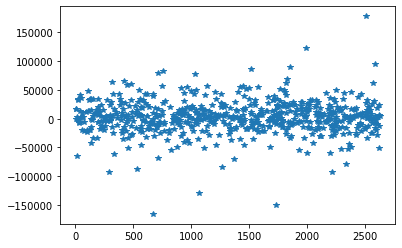

In [30]:
skmodel_home = LinearRegression()
sk_fit = skmodel_home.fit(pr_train, re_train)
sk_predict = sk_fit.predict(pr_test)
plt.plot(sk_predict - re_test, '*')

In [ ]:
house_model_lso = Lasso(alpha=0.00001,normalize=True)
house_model_lso.fit(pr_train,re_train)
predict_house = house_model_lso.predict(pr_test)
rmspe = (np.sqrt(np.mean(np.square((predict_house - re_test) / re_test))))

0.30062494949260815


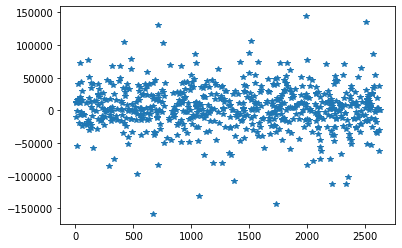

In [ ]:
print(rmspe)  #alpha=2 0.27947754515399276 alpha=3 0.27934700359789144
plt.plot((predict_house - re_test), '*')

0.2798948043434861